# ***OIL PRICE PREDICTION***

---

## ***Objective :***

### **Oil is a product that goes completely in a different direction for a single market event as the oil prices are rarely based on real-time data, instead, it is driven by externalities making our attempt to forecast it even more challenging As the economy will be highly affected by oil prices our model will help to understand the pattern in prices to help the customers and businesses to make smart decisions.**

**Analysis on oil price influence factors**

**The following are main factors affecting the oil prices:**

1.) Changes in the value of the U.S. dollar

2.) Changes in the policies of the Organization of Petroleum Exporting Countries (OPEC)

3.) Changes in the levels of oil production and inventory

4.) The health of the global economy

5.) The implementation (or collapse) of international agreements

**reference link:https://www.investopedia.com/articles/investing/102215/4-reasons-why-price-crude-oil-dropped.asp**

## ***Model Building Phase On Raw data***
### ***Importing the libraries required***

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")


### ***Importing the Dataset***

In [2]:
OILDATA=pd.read_csv("/content/sample_data/crude-oil-price.csv")

OILDATA.head(20)

,date,price,percentChange,change
0,1983-03-30T00:00:00,29.27,NaN,NaN
1,1983-04-04T00:00:00,30.63,4.646396,1.36
2,1983-05-02T00:00:00,30.25,-1.240614,-0.38
3,1983-06-01T00:00:00,31.38,3.735537,1.13
4,1983-07-01T00:00:00,32.00,1.975781,0.62
5,1983-08-01T00:00:00,31.59,-1.281250,-0.41
6,1983-09-01T00:00:00,30.36,-3.893637,-1.23
7,1983-10-03T00:00:00,30.37,0.032938,0.01
8,1983-11-01T00:00:00,29.23,-3.753704,-1.14
9,1983-12-01T00:00:00,29.60,1.265823,0.37


### ***Exploratory Data Analysis***
**In Time Series Analysis we will analyze to find out the below stuff**
+ Missing values
+Duplicated values
+Outlier Detection
+Feature Scaling
+Feature Extraction
+Correlation
+Skewness Removal
+Data Insights
+Stationarity Test
+Autocorrelation Function
+Partial Autocorrelation Function
+Lag plots
+Normal Distribution Analysis
+Relationshop between independent and dependent feature (price)

In [3]:
!pip install dataprep

DataPrep Report
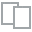
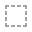
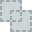
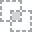
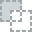
...
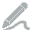
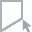
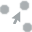
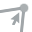
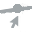

In [4]:
from dataprep.eda import plot, plot_correlation, plot_missing, create_report

create_report(OILDATA)

### **Observation: None of the Feature has missing Values in the data set**
***We wont have to handle the missing values by observing the distribution and making the optimal choice***


### ***Checking for Data types***

In [5]:
OILDATA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 469 entries, 0 to 468
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           469 non-null    object 
 1   price          469 non-null    float64
 2   percentChange  468 non-null    float64
 3   change         468 non-null    float64
dtypes: float64(3), object(1)
memory usage: 14.8+ KB


In [6]:
OILDATA.describe()

,price,percentChange,change
count,469.000000,468.000000,468.000000
mean,44.071641,0.838667,0.171068
std,28.376748,10.685748,4.954575
min,10.420000,-54.244861,-32.830000
25%,20.270000,-5.040127,-1.632500
50%,30.830000,0.956201,0.280000
75%,63.580000,6.511568,2.317500
max,140.000000,88.375796,16.650000


***price in USD/BBL***

In [7]:
OILDATA[OILDATA.duplicated()]

,date,price,percentChange,change


### **Observation: There are no duplicated values in the dataset**

### **Observation: As we can see we have 8 columns and 469 rows in our dataset.**

As our dataset is an time series data our dependent variable is '***price***' which we are going to forecast using '***Year***' as our independent variable.

### ***Formatting Date***

In [8]:
#OILDATA['date']=pd.to_datetime(OILDATA.date,format="%Y-%m-%d")

In [9]:
OILDATA['date']=pd.to_datetime(OILDATA.date,format="%Y-%m-%dT%H:%M:%S")

In [10]:
OILDATA

,date,price,percentChange,change
0,1983-03-30,29.27,NaN,NaN
1,1983-04-04,30.63,4.646396,1.36
2,1983-05-02,30.25,-1.240614,-0.38
3,1983-06-01,31.38,3.735537,1.13
4,1983-07-01,32.00,1.975781,0.62
...,...,...,...,...
464,2021-11-01,65.85,-19.479090,-15.93
465,2021-12-01,74.88,13.712984,9.03
466,2022-01-03,86.49,15.504808,11.61
467,2022-02-01,95.72,10.671754,9.23


In [11]:
OILDATA['Month']=OILDATA.date.dt.strftime("%b")

In [12]:
OILDATA['Year']=OILDATA.date.dt.strftime("%Y")

In [13]:
OILDATA['Day']=OILDATA.date.dt.strftime("%d")

In [14]:
OILDATA['Time']=OILDATA.date.dt.strftime("%H:%M:%S")

In [15]:
print("Year starts from {} to {}".format(OILDATA.date[0],OILDATA.date[468]))

Year starts from 1983-03-30 00:00:00 to 2022-03-01 00:00:00


### **Observation: As we can see in the 'Year' column we have all the years starting from 1983 to 2022 in these case we have a total of 40+ years of data in a Yearly format**

In [16]:
OILDATA.describe().T

,count,mean,std,min,25%,50%,75%,max
price,469.0,44.071641,28.376748,10.420000,20.270000,30.830000,63.580000,140.000000
percentChange,468.0,0.838667,10.685748,-54.244861,-5.040127,0.956201,6.511568,88.375796
change,468.0,0.171068,4.954575,-32.830000,-1.632500,0.280000,2.317500,16.650000


### **Observation:**
### **The mean is greater than median which indicates the data is skewed towards the right.**
+ ### **The 'price' column has positive skewness**
+ ### **The 'price' column has negative kurtosis**

### **Conclusion: The data is positive skewed, platykurtic and doesn't follow normal distribution**


In [17]:
OILDATA

,date,price,percentChange,change,Month,Year,Day,Time
0,1983-03-30,29.27,NaN,NaN,Mar,1983,30,00:00:00
1,1983-04-04,30.63,4.646396,1.36,Apr,1983,04,00:00:00
2,1983-05-02,30.25,-1.240614,-0.38,May,1983,02,00:00:00
3,1983-06-01,31.38,3.735537,1.13,Jun,1983,01,00:00:00
4,1983-07-01,32.00,1.975781,0.62,Jul,1983,01,00:00:00
...,...,...,...,...,...,...,...,...
464,2021-11-01,65.85,-19.479090,-15.93,Nov,2021,01,00:00:00
465,2021-12-01,74.88,13.712984,9.03,Dec,2021,01,00:00:00
466,2022-01-03,86.49,15.504808,11.61,Jan,2022,03,00:00:00
467,2022-02-01,95.72,10.671754,9.23,Feb,2022,01,00:00:00


In [18]:
OILDATA.nunique()

date             469
price            444
percentChange    468
change           381
Month             12
Year              40
Day                6
Time               1
dtype: int64

### **Analysing the Correlation among the Dependent variable ('Price') and the Independent Variable ('Year')**

### ***VISUALIZATION***


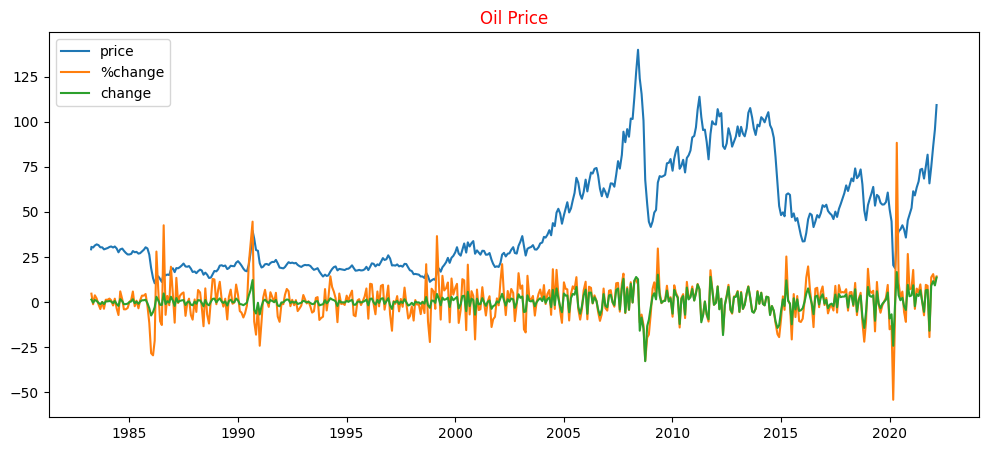

In [19]:
plt.figure(figsize=(12,5))
plt.plot(OILDATA["date"],OILDATA["price"],label="price")
plt.plot(OILDATA["date"],OILDATA["percentChange"],label="%change")
plt.plot(OILDATA["date"],OILDATA["change"],label="change")
plt.title("Oil Price",color='r')
plt.legend(loc="best")

***percentChange change columns are not requires for our forcasting so letus drop that after some time***

### ***Line plot***

<Axes: title={'center': 'Oil price year wise'}, xlabel='Year', ylabel='price'>

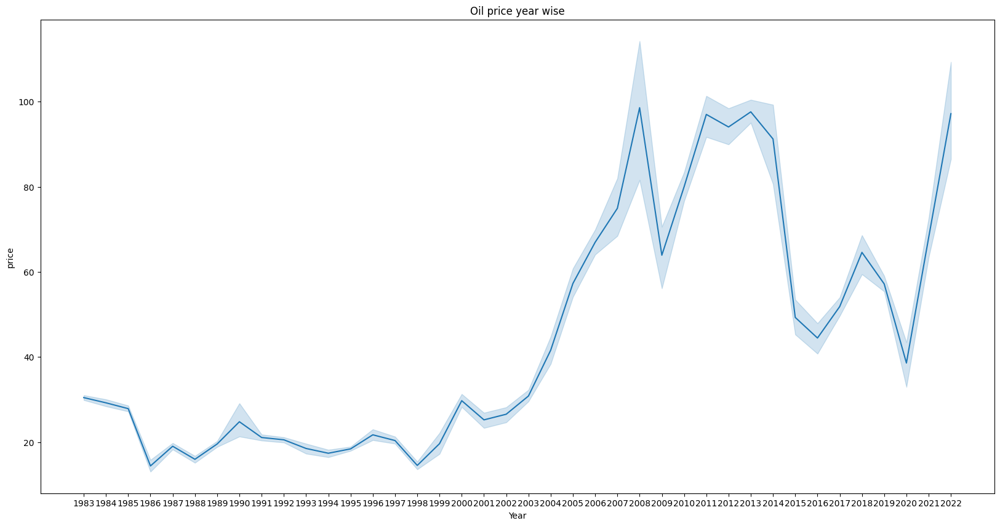

In [20]:
plt.figure(figsize=(20,10))
plt.title("Oil price year wise")
sns.lineplot(x=OILDATA["Year"],y=OILDATA["price"])

<Axes: title={'center': 'Whole Data set Visualization'}, xlabel='Month', ylabel='Year'>

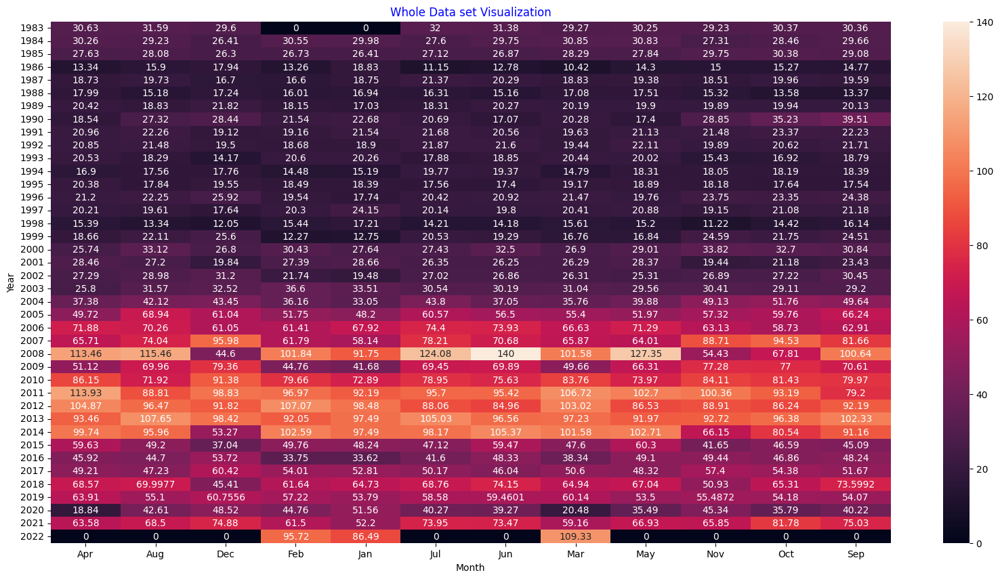

In [21]:
plt.figure(figsize=(20,10))
plt.title("Whole Data set Visualization",c="b")
heatmap = pd.pivot_table(data=OILDATA, values="price", index="Year", columns="Month", aggfunc="mean",fill_value=0)
sns.heatmap(heatmap,annot=True,fmt="g")

### ***Quarter wise***

In [22]:
OILDATA.set_index("date", inplace=True)

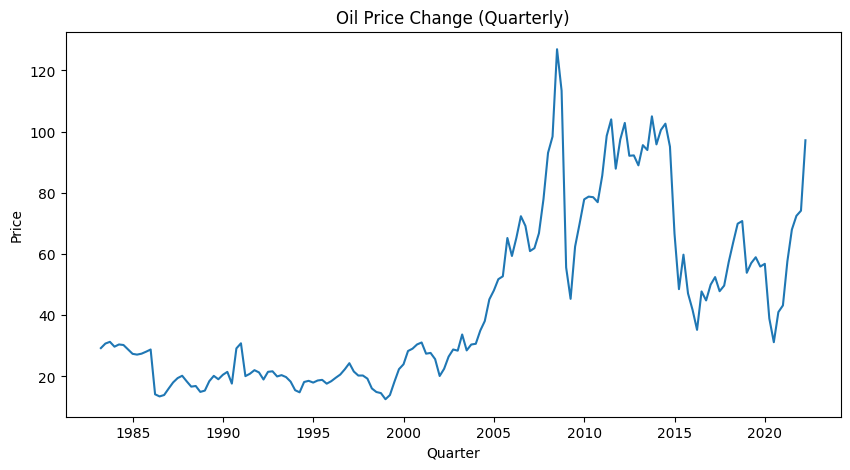

In [23]:
# Resample the data by quarter
quarterly_data = OILDATA.resample("Q").mean()

# Plotting quarter-wise changes
plt.figure(figsize=(10, 5))
plt.title("Oil Price Change (Quarterly)")
sns.lineplot(x=quarterly_data.index, y=quarterly_data["price"])
plt.xlabel("Quarter")
plt.ylabel("Price")

plt.show()

In [24]:
quarterly_data

,price,percentChange,change
date,,,
1983-03-31,29.270000,NaN,NaN
1983-06-30,30.753333,2.380440,0.703333
1983-09-30,31.316667,-1.066369,-0.340000
1983-12-31,29.733333,-0.818314,-0.253333
1984-03-31,30.460000,1.389016,0.416667
...,...,...,...
2021-03-31,57.620000,7.198572,3.546667
2021-06-30,67.993333,7.503873,4.770000
2021-09-30,72.493333,0.938777,0.520000


### ***Decade Wise***

Text(0, 0.5, 'Price')

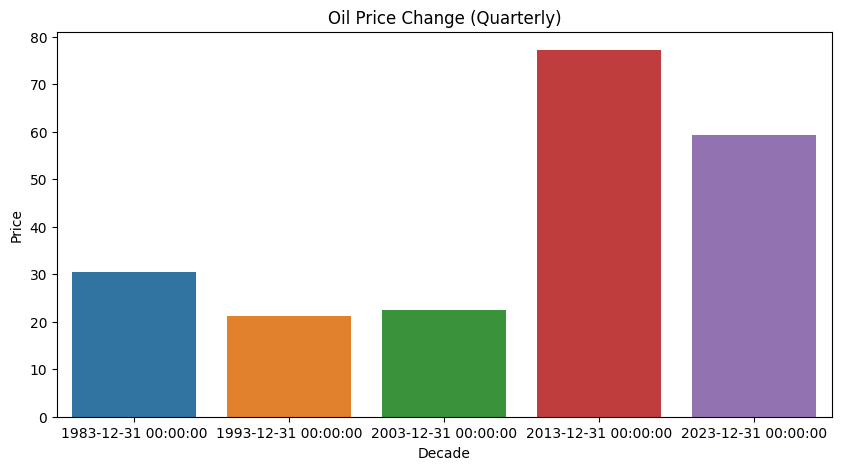

In [25]:
decade_data=OILDATA.resample("10Y").mean()

# Plotting quarter-wise changes
plt.figure(figsize=(10, 5))
plt.title("Oil Price Change (Quarterly)")
sns.barplot(x=decade_data.index, y=decade_data["price"])
plt.xlabel("Decade")
plt.ylabel("Price")


In [26]:
decade_data

,price,percentChange,change
date,,,
1983-12-31,30.468000,0.165252,0.036667
1993-12-31,21.107000,-0.074399,-0.128583
2003-12-31,22.447500,1.108046,0.152917
2013-12-31,77.194083,1.332668,0.549167
2023-12-31,59.344341,1.081325,0.110202


#### Boxplot

<Axes: xlabel='Month', ylabel='price'>

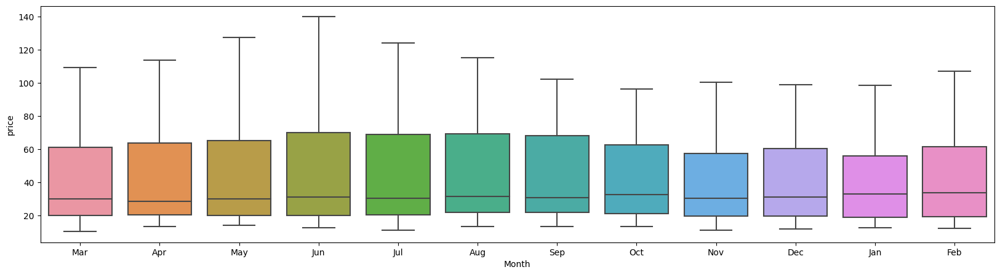

In [27]:
plt.figure(figsize=(20,5))
sns.boxplot(x='Month',y='price',data=OILDATA)

<Axes: xlabel='Year', ylabel='price'>

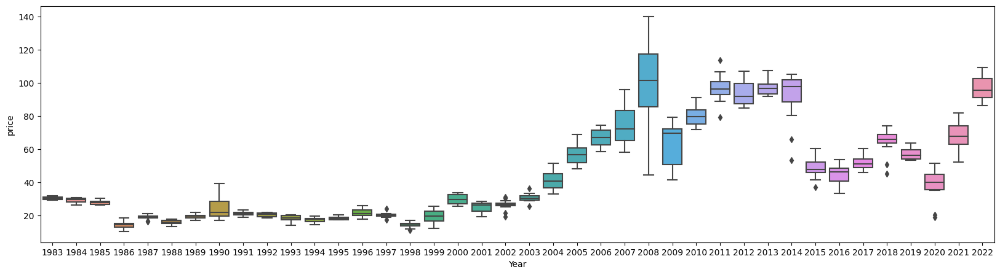

In [28]:
plt.figure(figsize=(20,5))
sns.boxplot(x='Year',y='price',data=OILDATA)

<Axes: xlabel='Day', ylabel='price'>

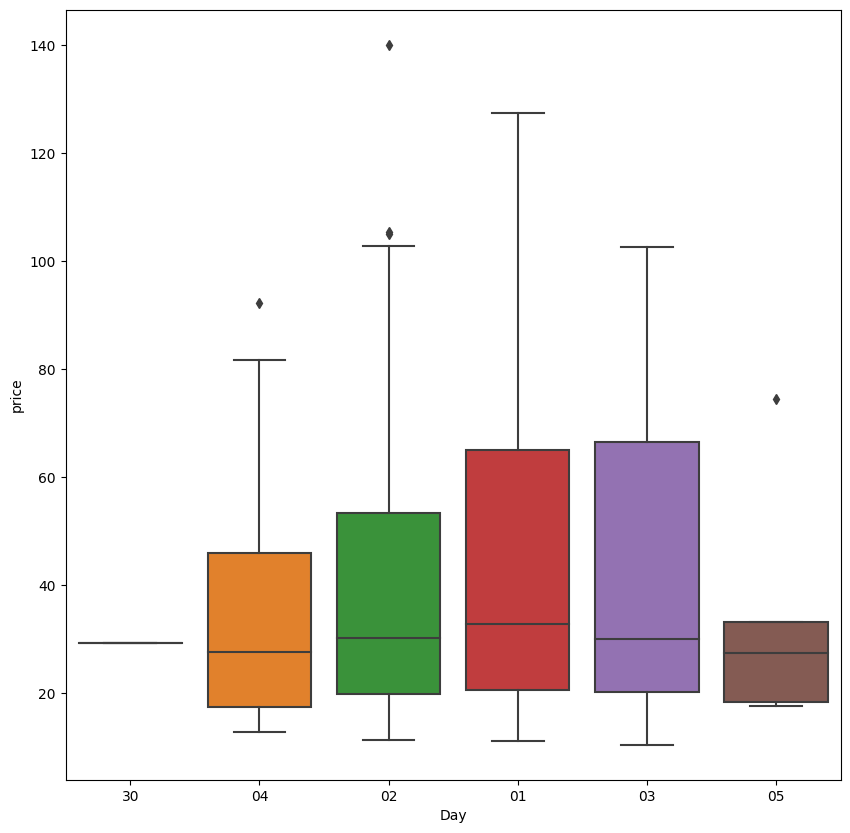

In [29]:
plt.figure(figsize=(10,10))
sns.boxplot(x='Day',y='price',data=OILDATA)

**From above plot we can understand that after 2000 a high in oil price which can relate to the US invation on Middle east and Economic crisis in 2008 made a sudden drop after recession a large high got and from 2015 onwards it got reduced.But due to Covid it got some fluctuation and again reovered to high values still its increasing which have the infulence of Russia-Ukrain War and Global crude oil price Hike.**

**The year 2015 was a perfect storm for oil prices.**
**The dollar was strong. Inventories were huge. The economy was weak. And production was growing.**
**All of these factors drove the price of crude oil to less than $40 per barrel.**

## **Outlier detection**
## ***Box plot and interquartile range***
### ***Extracting Outliers***

<Axes: xlabel='Time', ylabel='price'>

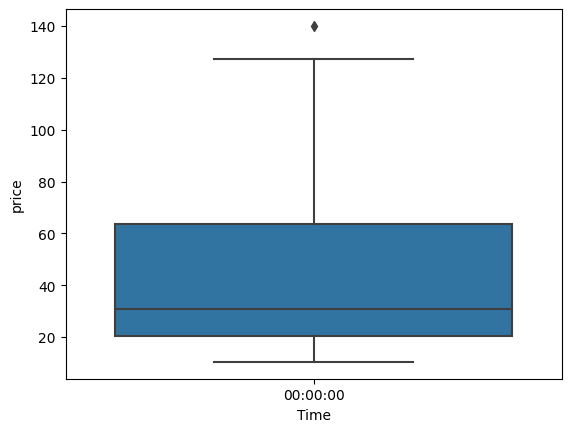

In [30]:
sns.boxplot(x='Time',y='price',data=OILDATA)

Text(0.8, 30.83, 'Median:30.83')

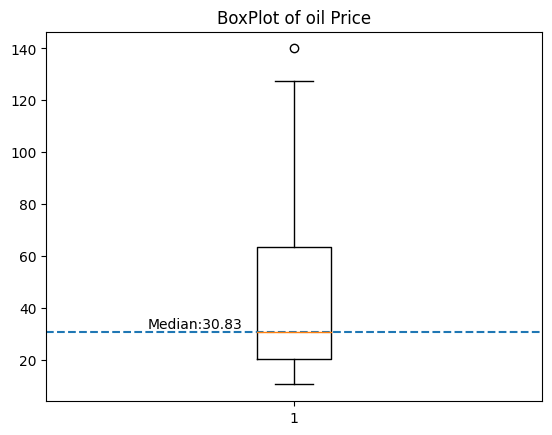

In [31]:
median=OILDATA["price"].median()
plt.boxplot("price",data=OILDATA)
plt.title("BoxPlot of oil Price")
plt.axhline(y=OILDATA["price"].median(),linestyle='--')
plt.text(0.8,median,f"Median:{median}",ha='center',va='bottom')


### Skewness

Text(0.5, 1.0, 'price')

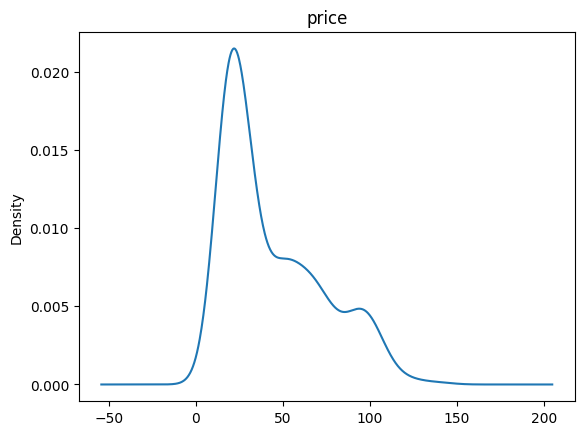

In [32]:
OILDATA['price'].plot(kind='kde')
plt.title("price")

**It refers to a distribution that has a long tail on the right side and is skewed towards higher values. In a right-skewed distribution, the majority of the data points are concentrated towards the lower end of the distribution, while a few extreme values are present on the right side, pulling the mean or median in that direction. The tail on the right side indicates that there are outliers or high values that occur less frequently.**

In [33]:
import statsmodels.api as sm
import pylab as py

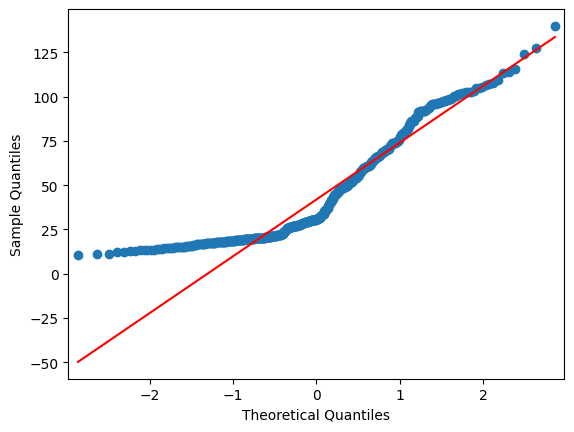

In [34]:
sm.qqplot(OILDATA["price"],line='q')
py.show()

In [35]:
OILDATA["price"].describe()

count    469.000000
mean      44.071641
std       28.376748
min       10.420000
25%       20.270000
50%       30.830000
75%       63.580000
max      140.000000
Name: price, dtype: float64

In [36]:
OILDATA["price"].median()

30.83

### **We can see the variable is skewed. So, we will use interquantile range to find outliers.**
## ***Z score for Outlier Detection***

Z score is an important concept in statistics. Z score is also called standard score. This score helps to understand if a data value is greater or smaller than mean and how far away it is from the mean. More specifically, Z score tells how many standard deviations away a data point is from the mean.

**Z score = (x -mean) / std. deviation**

***A normal distribution is shown below and it is estimated that***
+ 68% of the data points lie between +/- 1 standard deviation.
+ 95% of the data points lie between +/- 2 standard deviation
+ 99.7% of the data points lie between +/- 3 standard deviation


In [37]:
median=OILDATA["price"].median()

In [38]:
data = OILDATA.price
mean = np.mean(data)
std = np.std(data)
print('mean of the dataset is', mean)
print('std. deviation is', std)

mean of the dataset is 44.07164136460555
std. deviation is 28.346479363741345


In [39]:
threshold = 3
outlier = []
for i in data:
    z = (i-mean)/std
    if z > threshold:
        outlier.append(i)
    elif z < -(threshold):
        outlier.append(i)
print('outlier in dataset is', outlier)

outlier in dataset is [140.0]


**In forecasting, it is generally recommended to evaluate the presence of outliers and their potential impact on the model. Outliers can significantly affect the accuracy of the forecast by skewing the underlying patterns and relationships. So since its avisible to not remove outliers we can keep these out liers as it is.**



### ***Univariate Analysis***
### ***Histogram plot***

<Axes: >

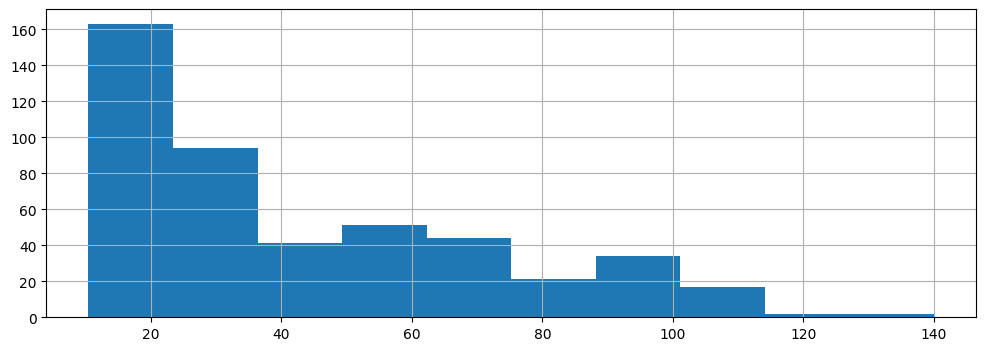

In [40]:
OILDATA['price'].hist(figsize=(12,4))

<Axes: xlabel='price', ylabel='Density'>

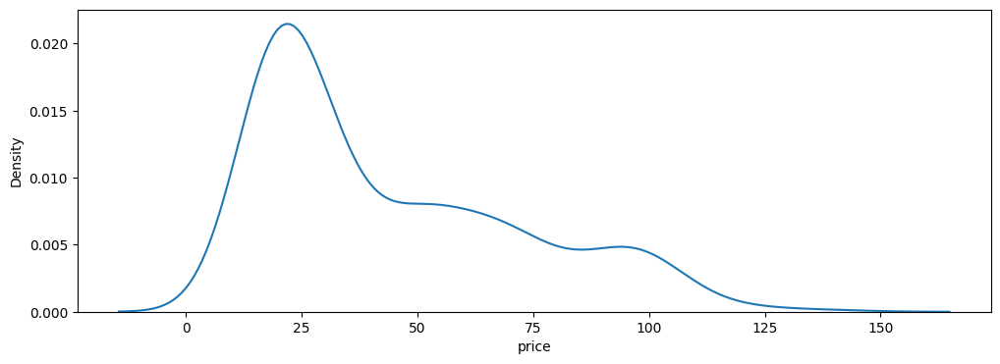

In [41]:
plt.figure(figsize=(12,4))
sns.distplot(OILDATA['price'], hist=False)

1. We can see that the frequency of the number of price are continious.
2. As the number of price increases, there is no gradual drop in the frequency of that number of price found to be decreasing.

In forecasting, it is generally recommended to evaluate the presence of outliers and their potential impact on the model. Outliers can significantly affect the accuracy of the forecast by skewing the underlying patterns and relationships.
So since its avisible to not remove outliers we can keep these out liers as it is.

We will consider only price value only because we have to predict price value only.

So  from our data set we will keep date and price only rest all features we will delete.

In [42]:
Finaldf=OILDATA.drop(columns=["percentChange","change","Month","Year","Day","Time"])

In [43]:
Finaldf

,price
date,
1983-03-30,29.27
1983-04-04,30.63
1983-05-02,30.25
1983-06-01,31.38
1983-07-01,32.00
...,...
2021-11-01,65.85
2021-12-01,74.88
2022-01-03,86.49


### Lag Plot

## **Lag plot**
A lag plot is a special type of scatter plot in which the X-axis represents the dataset with some time units behind or ahead as compared to the Y-axis. The difference between these time units is called lag or lagged and it is represented by k.

The lag plot contains the following axes:

**Vertical axis**: Yi for all i Horizontal axis: Yi-k for all i, where k is lag value The lag plot is used to answer the following questions:

+ **Distribution of Model**: Distribution of model here means deciding what is the shape of data on the basis of the lag plot. Below are some examples of lag plot and their original plot:
If the lag plot is linear, then the underlying structure is of the autoregressive model. If the lag plot is of elliptical shape, then the underlying structure represents a continuous periodic function such as sine, cosine, etc.

+ **Outliers**: Outliers are a set of data points that represent the extreme values in the distribution
+ **Randomness in data**: The lag plot is also useful for checking whether the given dataset is random or not. If there is randomness in the data then it will be reflected in the lag plot, if there is no pattern in the lag plot.
+ **Seasonality**: If there is seasonality in the plot then, it will give a periodic lag plot.
+ **Autocorrelation**: If the lag plot gives a linear plot, then it means the autocorrelation is present in the data, whether there is positive autocorrelation or negative that depends upon the slope of the line of the dataset. If more data is concentrated on the diagonal in lag plot, it means there is a strong autocorrelation

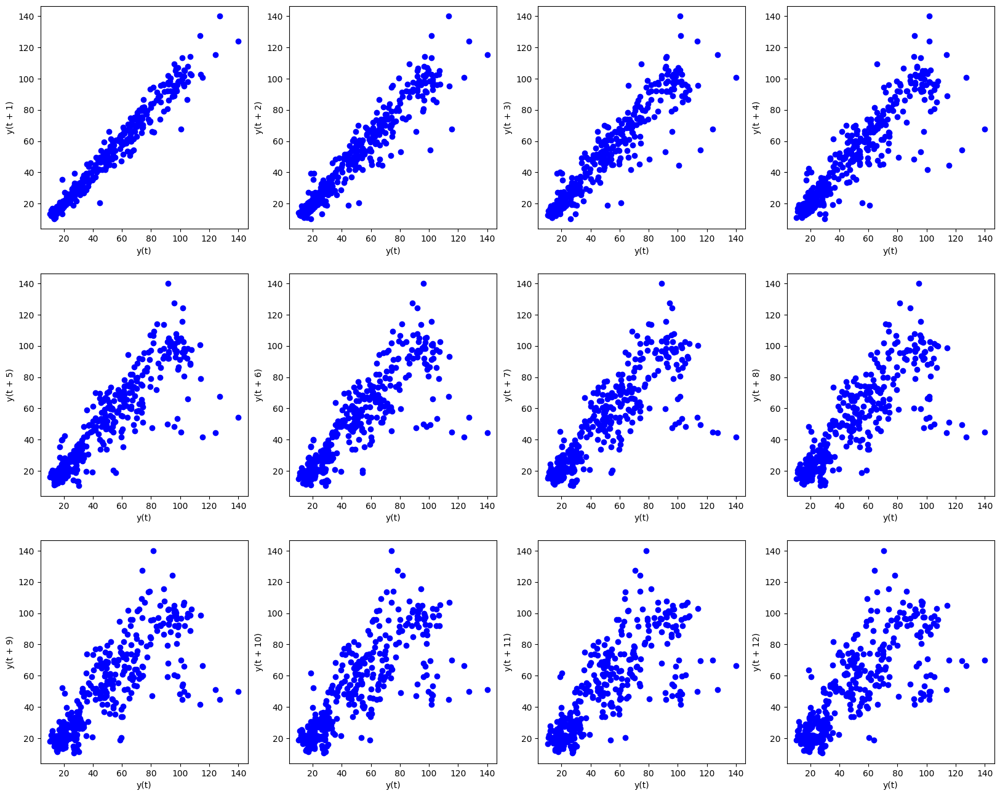

In [44]:
from pandas.plotting import lag_plot
fig, axes = plt.subplots(figsize=(20,16), ncols=4, nrows=3)

lag_plot(Finaldf["price"], lag=1, c = ['blue'][0], ax=axes[0,0])
lag_plot(Finaldf["price"], lag=2, c = ['blue'][0], ax=axes[0,1])
lag_plot(Finaldf["price"], lag=3, c = ['blue'][0], ax=axes[0,2])
lag_plot(Finaldf["price"], lag=4, c = ['blue'][0], ax=axes[0,3])
lag_plot(Finaldf["price"], lag=5, c = ['blue'][0], ax=axes[1,0])
lag_plot(Finaldf["price"], lag=6, c = ['blue'][0], ax=axes[1,1])
lag_plot(Finaldf["price"], lag=7, c = ['blue'][0], ax=axes[1,2])
lag_plot(Finaldf["price"], lag=8, c = ['blue'][0], ax=axes[1,3])
lag_plot(Finaldf["price"], lag=9, c = ['blue'][0], ax=axes[2,0])
lag_plot(Finaldf["price"], lag=10, c = ['blue'][0], ax=axes[2,1])
lag_plot(Finaldf["price"], lag=11, c = ['blue'][0], ax=axes[2,2])
lag_plot(Finaldf["price"], lag=12, c = ['blue'][0], ax=axes[2,3])

plt.show()

### ***Observation: Our data is linear mostly linear and it shows positive autocorrelation with the previous lag values and it has an underlying structure of and autoregressive model.***
## ***Time Series Decomposition***
1. **Seasonality**

Seasonality is a simple term that means while predicting a time series data there are some months in a particular domain where the output value is at a peak as compared to other months. for example if you observe the data of tours and travels companies of past 3 years then you can see that in November and December the distribution will be very high due to holiday season and festival season. So while forecasting time series data we need to capture this seasonality.

2. **Trend**
The trend is also one of the important factors which describe that there is certainly increasing or decreasing trend time series, which actually means the value of organization or sales over a period of time and seasonality is increasing or decreasing.

## **Additive Seasonal Decomposition**

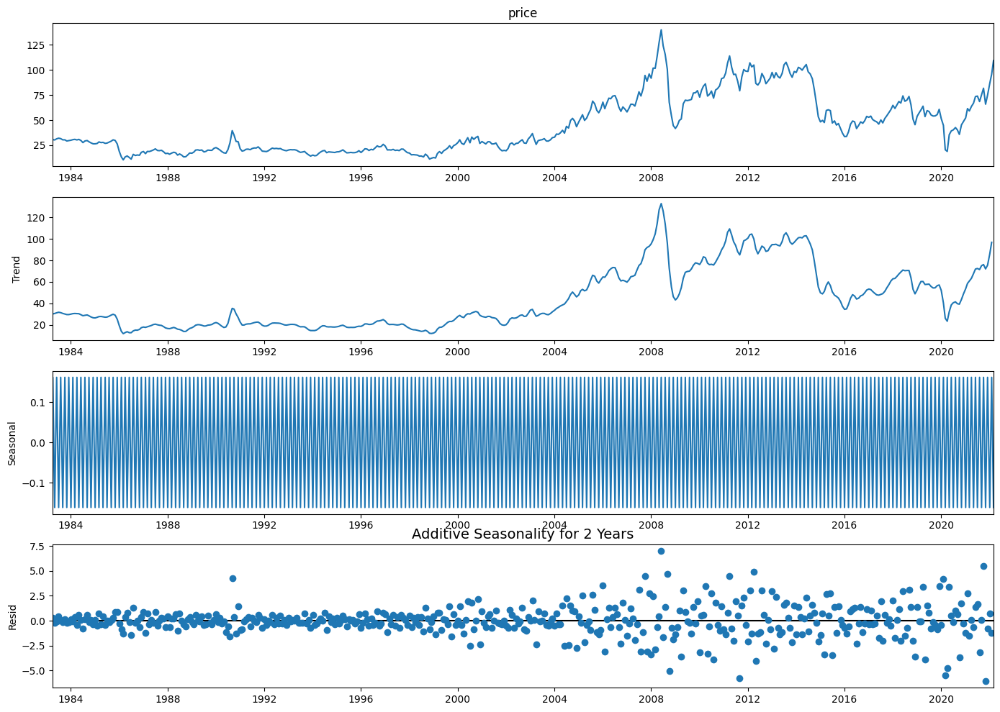

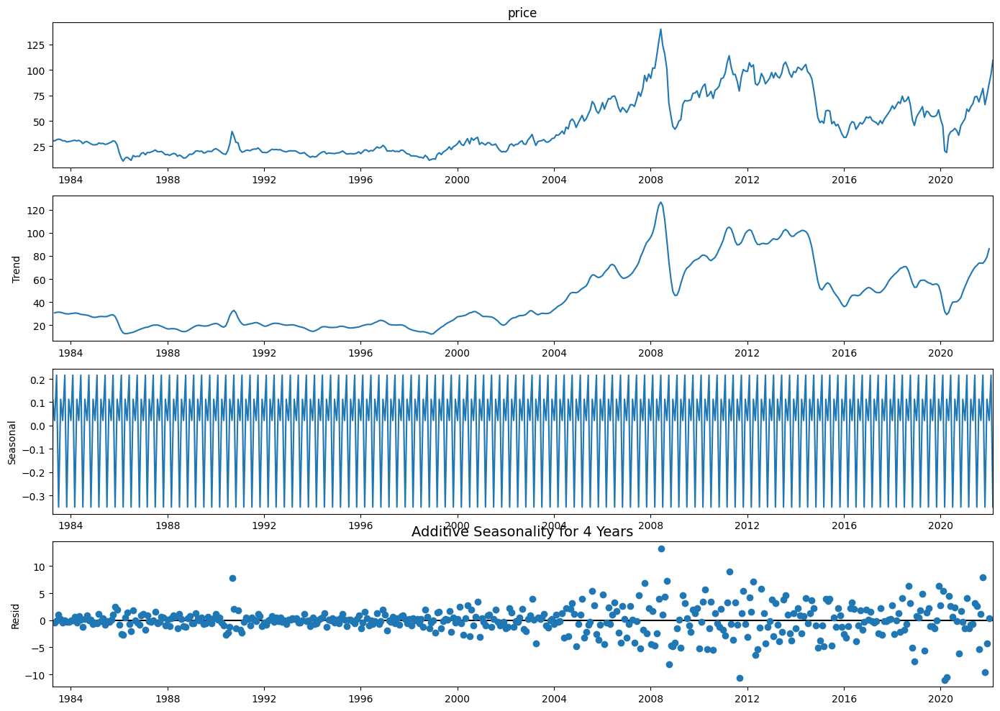

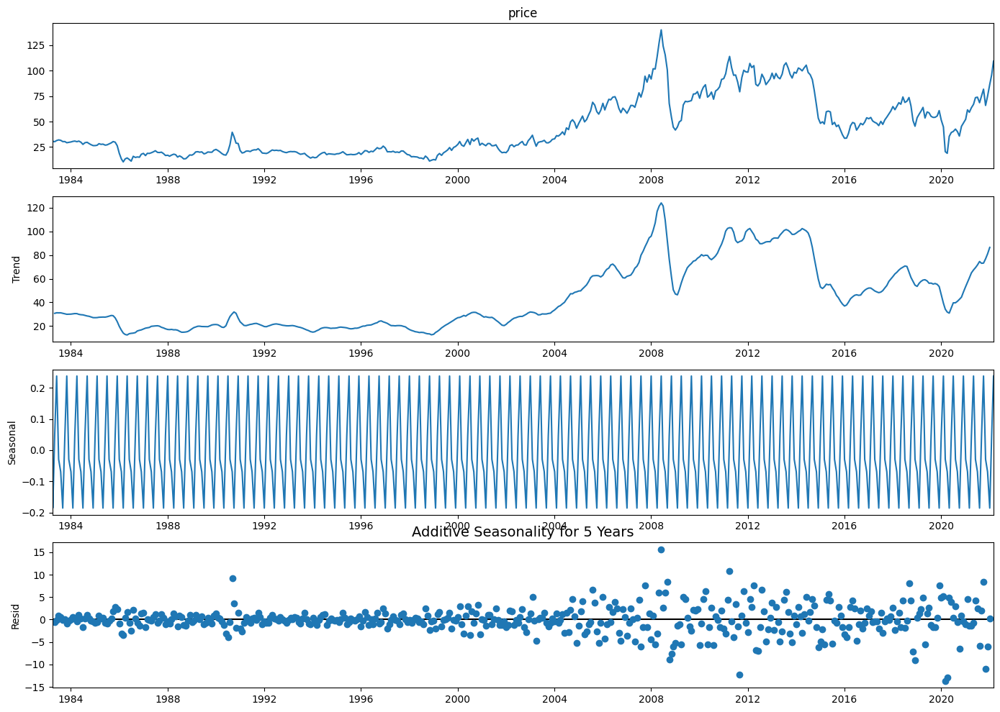

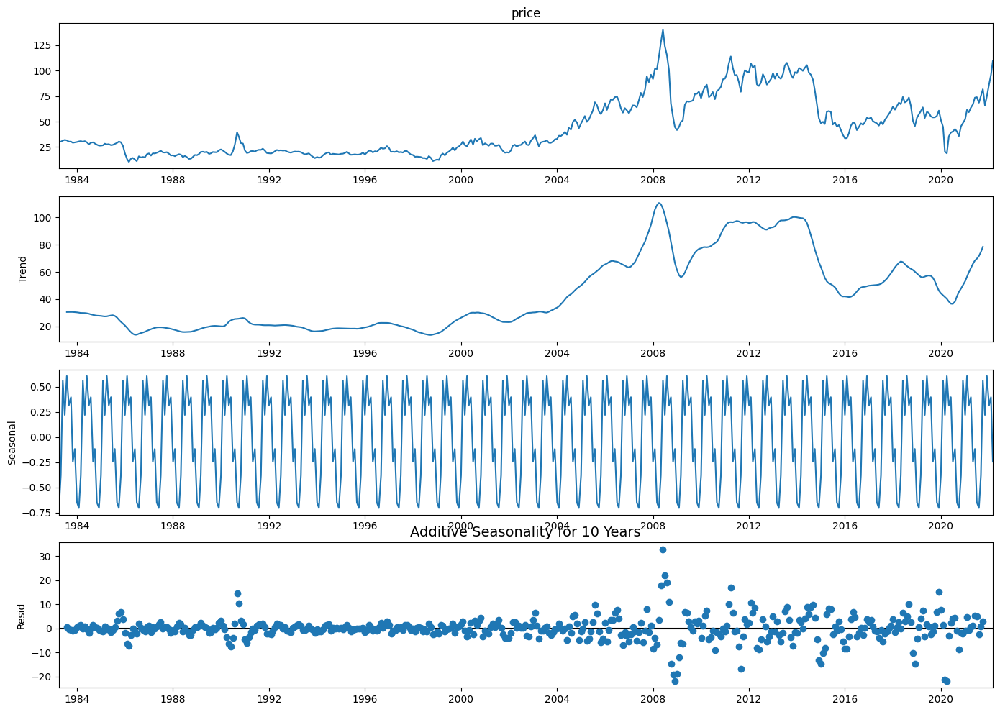

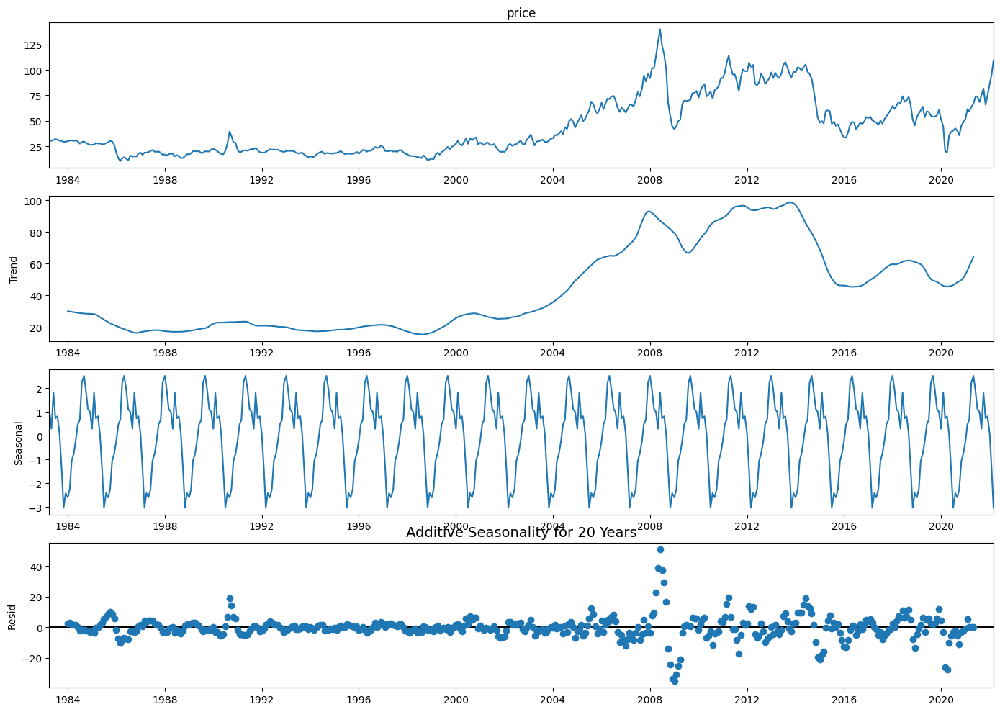

In [45]:
from statsmodels.tsa.seasonal import seasonal_decompose
for i in [2, 4, 5, 10, 20]:
    decompose_ts_add = seasonal_decompose(Finaldf["price"], model='additive', period = i)
    with plt.rc_context():
        plt.rc("figure", figsize=(14,10))
        decompose_ts_add.plot()
        plt.title('Additive Seasonality for '+str(i)+' Years', fontsize=14)
        plt.show()

## **Observation:-**
+ **Observed** - Actual data
+ **Trend** - Increasing or decreasing trend.
+ **Seasonal** -
  +  Each cycle represents each year trend.
  + The value in the Y-axis has to be added to the Trend plot value to get the actual value of that year.
+ **Residual** - It is the noise pattern of the time series data for each year, which was not captured by the two components - Trend and Seasonality. Residual is the left over after decomposition of the two major components (Trend and Seasonality)

## ***Multiplicative Seasonal Decomposition***

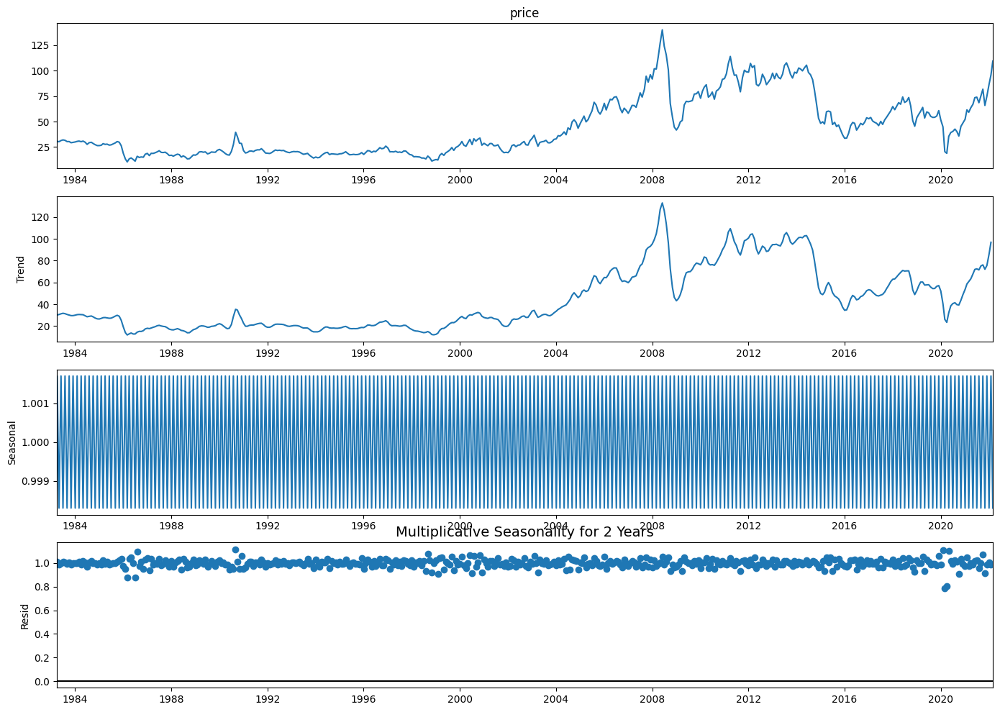

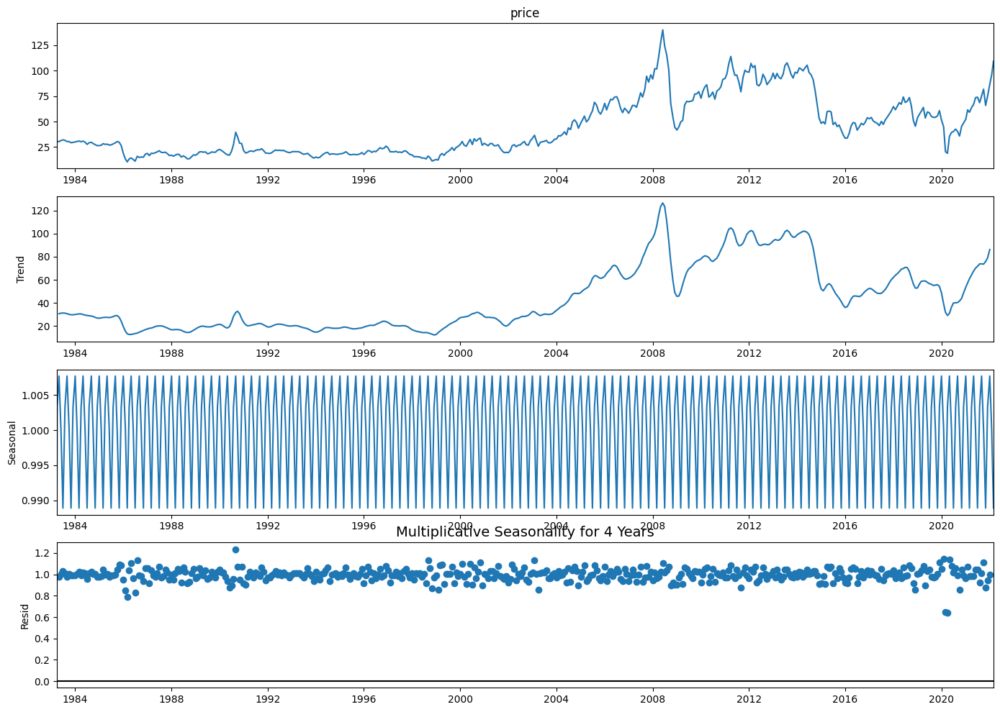

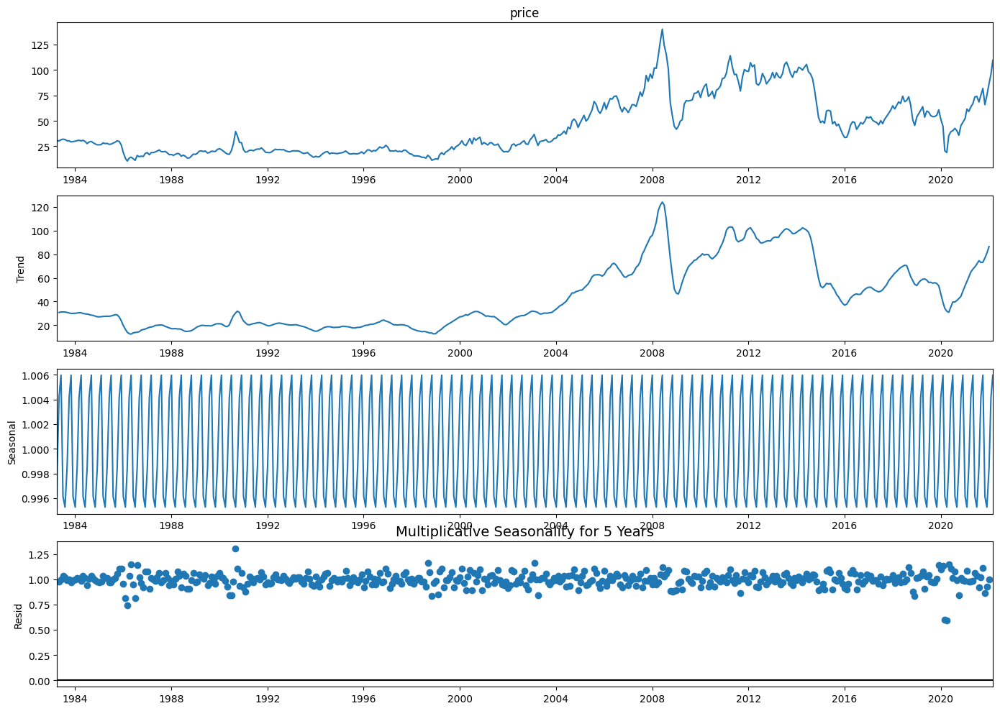

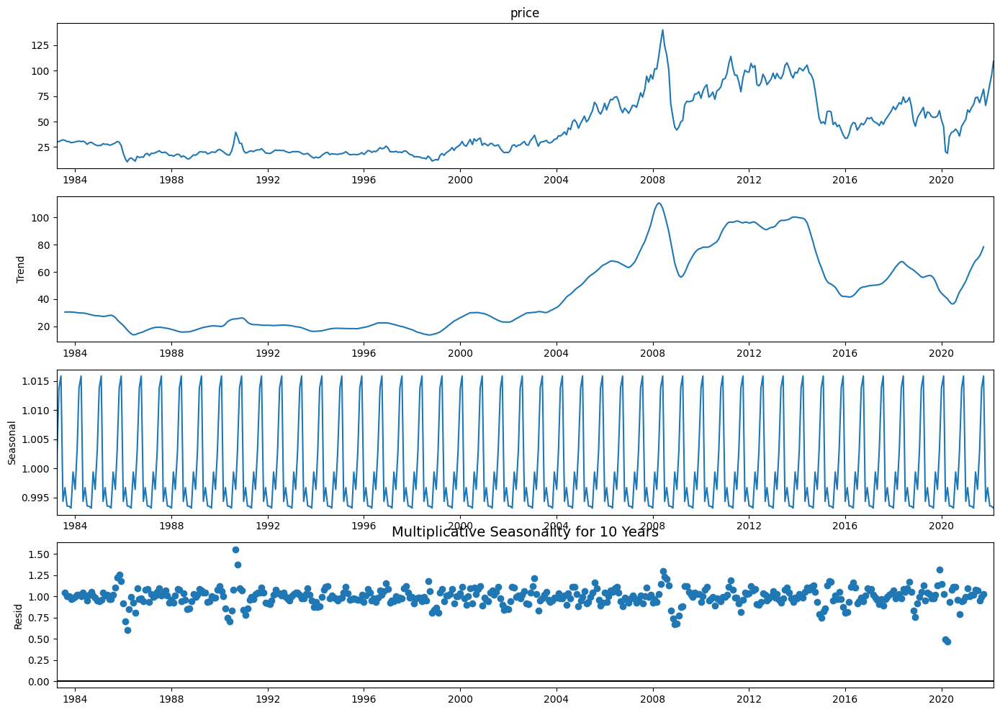

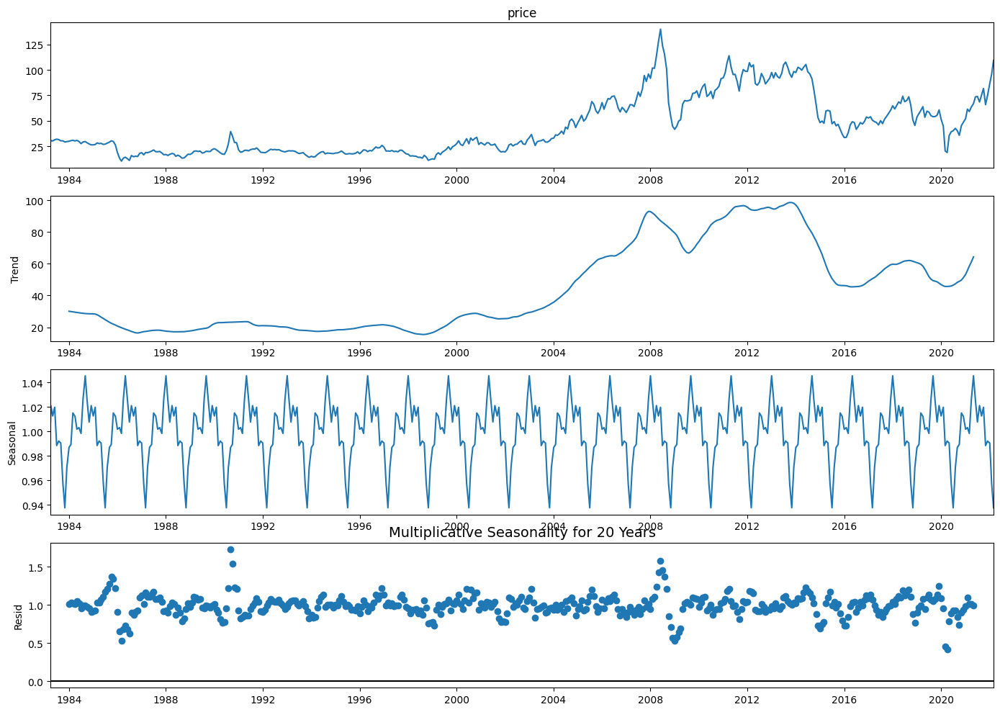

In [46]:
for i in [2, 4, 5, 10, 20]:
    decompose_ts_add = seasonal_decompose(Finaldf["price"], model='multiplicative', period = i)
    with plt.rc_context():
        plt.rc("figure", figsize=(14,10))
        decompose_ts_add.plot()
        plt.title('Multiplicative Seasonality for '+str(i)+' Years', fontsize=14)
        plt.show()

### **Observation: As we can see there is an upward trend in the time series Data**
## ***Splitting the data into train and test***
+ **Training Data = Fit the model only to training period.**
+ **Testing Data = Assess the model performance on Testing.**
+ **Deploy model by training on whole dataset. No random partition That’s because the order sequence of the time series should be intact in order to use it for forecasting.**

In [47]:
Train=Finaldf.head(400)
Test=Finaldf.tail(69)

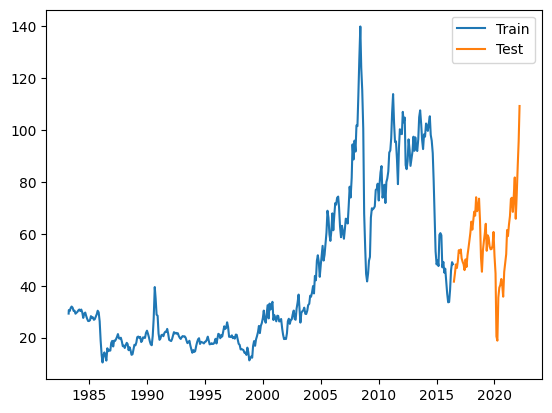

In [48]:
#plt.title("Oil Price",c='r')
plt.plot(Train.index,Train["price"],label="Train")
plt.plot(Test.index,Test["price"],label="Test")
plt.legend(loc="best")

In [49]:
Train

,price
date,
1983-03-30,29.27
1983-04-04,30.63
1983-05-02,30.25
1983-06-01,31.38
1983-07-01,32.00
...,...
2016-02-01,33.75
2016-03-01,38.34
2016-04-01,45.92


In [50]:
Test

,price
date,
2016-07-01,41.60
2016-08-01,44.70
2016-09-01,48.24
2016-10-03,46.86
2016-11-01,49.44
...,...
2021-11-01,65.85
2021-12-01,74.88
2022-01-03,86.49


In [51]:
print('Train:',Train.index.min()," ","TO"," ",Train.index.max(),'\n',
'Test:',Test.index.min()," ","TO"," ",Test.index.max())

Train: 1983-03-30 00:00:00   TO   2016-06-01 00:00:00 
 Test: 2016-07-01 00:00:00   TO   2022-03-01 00:00:00



## **ACF plots and PACF plots**
***Autocorrelation Function (ACF)***

The autocorrelation function (ACF) is a statistical technique that we can use to identify how correlated the values in a time series are with each other. The ACF plots the correlation coefficient against the lag, which is measured in terms of a number of periods or units. A lag corresponds to a certain point in time after which we observe the first value in the time series.

The correlation coefficient can range from -1 (a perfect negative relationship) to +1 (a perfect positive relationship). A coefficient of 0 means that there is no relationship between the variables. Also, most often, it is measured either by Pearson’s correlation coefficient or by Spearman’s rank correlation coefficient.

It’s most often used to analyze sequences of numbers from random processes, such as economic or scientific measurements. It can also be used to detect systematic patterns in correlated data sets such as securities prices or climate measurements. Below, we can see an example of the ACF plot:

In [52]:
import statsmodels.graphics.tsaplots as tsa_plots

<Figure size 1200x600 with 0 Axes>

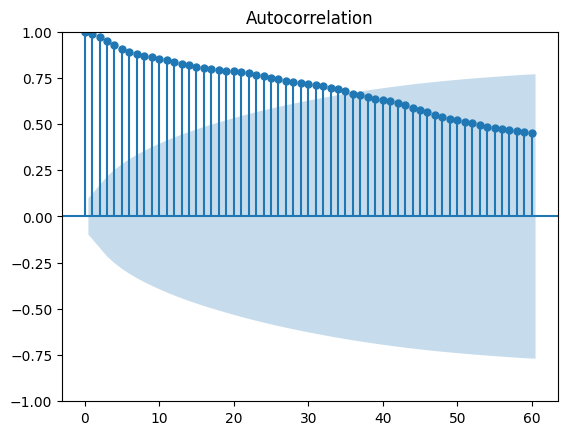

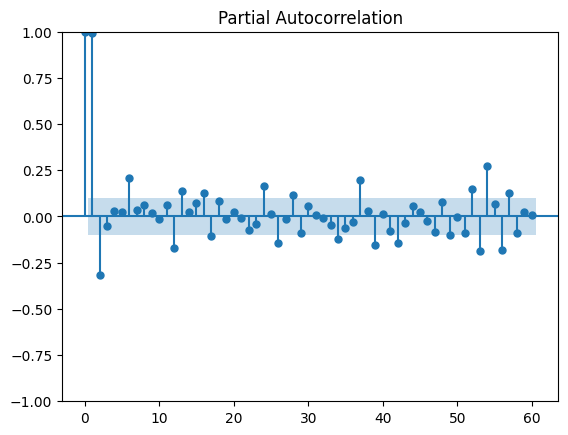

In [53]:
plt.figure(figsize=(12,6))
tsa_plots.plot_acf(Train.price,lags=60)
tsa_plots.plot_pacf(Train.price,lags=60)
plt.show()

**from above ACF plot upto 35-40 lags are above +2SE and its highly direct and indirect correlated.But when we consider for PACF we can see that first 2 that lag one and 2 are above +2SE but lag 3 nearly -2SE so which shows very less correlation compared to first two so passimoniuosly we can select ACF AS 36 lag and PACF 2 Which will be use full for AR and MA building time.**

## **Model Building**


---


***Naive Forecasting***: Start with a simple baseline model, such as a naive forecast. Naive forecasting assumes that future values will be the same as the most recent observation. Calculate the accuracy metrics (e.g., mean absolute error, root mean squared error) to establish a benchmark for evaluating other models.

***Moving Average (MA) Models***: MA models capture the dependence between an observation and a residual error from a moving average of previous observations. They are denoted as MA(q), where 'q' represents the order of the model. Use the autocorrelation function (ACF) and partial autocorrelation function (PACF) plots to determine the appropriate order of the MA model.

***Autoregressive (AR) Models***: AR models assume that future values are linearly dependent on previous observations. They are denoted as AR(p), where 'p' represents the order of the model. Analyze the PACF plot to determine the appropriate order of the AR model.

***Autoregressive Moving Average (ARMA) Models***: ARMA models combine both AR and MA components. They are denoted as ARMA(p, q), where 'p' represents the order of the AR model and 'q' represents the order of the MA model. Determine the appropriate orders of both components using the ACF and PACF plots.

***Autoregressive Integrated Moving Average (ARIMA) Models***: ARIMA models extend ARMA models by incorporating differencing to remove trends or seasonality in the data. They are denoted as ARIMA(p, d, q), where 'd' represents the degree of differencing. Use the differencing process to make the data stationary, then determine the appropriate orders of the AR, I (differencing), and MA components using the ACF and PACF plots.

***Seasonal ARIMA (SARIMA) Models***: SARIMA models are used when the data exhibits seasonal patterns. They incorporate seasonal differencing and seasonal AR and MA components. SARIMA models are denoted as SARIMA(p, d, q)(P, D, Q, m), where the capital letters represent the seasonal orders and 'm' is the length of the seasonal cycle.

***Exponential Smoothing (ETS) Models***: ETS models capture the underlying patterns in the data by assigning exponentially decreasing weights to previous observations. They are available in different variations, including Simple Exponential Smoothing, Holt's Linear Exponential Smoothing, and Holt-Winters' Seasonal Exponential Smoothing. Choose the appropriate ETS model based on the presence of trend and seasonality in the data.

***Prophet***: Prophet is a forecasting model developed by Facebook that incorporates seasonality, trends, and holiday effects. It is a flexible model that can handle various time series patterns. Prophet uses a decomposable time series model with three main components: trend, seasonality, and holidays.

***Machine Learning Models***: Consider using machine learning algorithms, such as Random Forest, Gradient Boosting

(Youtube:"https://www.youtube.com/watch?v=FPM6it4v8MY&t=7736s")

### ***Time Series Decomposition***

**To understand trend and seasonality let us decompose and cross verify inner components of the above graph as a prerequisite for our datamodeling**

In [54]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [55]:
import numpy as np

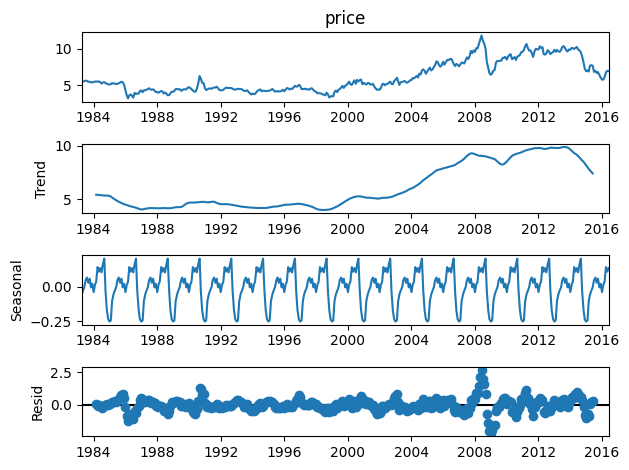

In [56]:
decomposed_data=seasonal_decompose(np.sqrt(Train["price"]),period=24)
decomposed_data.plot()
plt.show()

**Taken information from ExcelR ppt on forcasting.**

**for model building concept we can refer following website**

**https://www.hindawi.com/journals/mpe/2021/5589717/**

**Trend is upwardtrend**

### ***Naive Model***

In [57]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [58]:
last_observed_value = Train['price'].iloc[-1]
Test['naive_forecast'] = last_observed_value

In [59]:
for i in range(1,len(Test["price"])):
    Test['naive_forecast']=Test["price"].iloc[i-1]

In [60]:
Naivemae = mean_absolute_error(Test['price'], Test['naive_forecast'])
Naive_rmse = mean_squared_error(Test['price'], Test['naive_forecast'], squared=False)


In [61]:
Naive_mse=np.mean( Test['naive_forecast']-Test['price'])

In [62]:
Naive_mse

38.62420579710145

In [63]:
Test['naive_forecast']

date
2016-07-01    95.72
2016-08-01    95.72
2016-09-01    95.72
2016-10-03    95.72
2016-11-01    95.72
              ...  
2021-11-01    95.72
2021-12-01    95.72
2022-01-03    95.72
2022-02-01    95.72
2022-03-01    95.72
Name: naive_forecast, Length: 69, dtype: float64

In [64]:
Naive_rmse=np.sqrt(Naive_mse)

In [65]:
Naive_rmse

6.214837551947875

In [66]:
Naivemae

39.01869855072464

In [67]:
Naive_mse

38.62420579710145

***Here's a comparison between MAE and RMSE:***

**Mean Absolute Error (MAE)**: MAE measures the average absolute difference between the forecasted values and the actual values. It provides a measure of the magnitude of errors without considering their direction. MAE is useful when all errors are considered equally important, and you want to understand the average absolute deviation of the forecast from the actual values.

**Root Mean Squared Error (RMSE)**: RMSE is the square root of the average of the squared differences between the forecasted values and the actual values. RMSE gives more weight to large errors because of the squared term, and it is useful when you want to penalize larger deviations between the forecast and the actual values. RMSE is particularly sensitive to outliers or large errors in the data.

In general, if you want to have a metric that is easily interpretable and represents the average magnitude of errors, MAE is a good choice. On the other hand, if you want to emphasize the impact of larger errors and want to penalize them more, RMSE is a suitable option.

Ultimately, the choice between MAE and RMSE depends on the specific context of your forecasting problem and the importance you assign to different types of errors. It's also a good practice to consider both metrics and compare them to gain a more comprehensive understanding of the model's performance.

**Next we are going for AR,MA ARMA models which works only on stationary data which means no trend and no seasonality.But here we have trend and seasonality so we need to remove it.**

1.) To check seasonality Go for ADF test

2.) AR p value or order value check for pacf plot

3.) MA q value ororder value check for Acf plot

4.) To comfirm perfect model order for ar and ma undergo with LLR test which internally perform hypothesis test and shows which order our model shows better performance.

5.) ARIMA model order p,q which can take from AR and MA models and finalize order (p,q) with LLR test as previous steps

6.) Build model find MSE and RMSE.

### ***Scaling The Data***

In [68]:
from sklearn.preprocessing import StandardScaler

In [69]:
scaler=StandardScaler()

In [70]:
OILDATA

,price,percentChange,change,Month,Year,Day,Time
date,,,,,,,
1983-03-30,29.27,NaN,NaN,Mar,1983,30,00:00:00
1983-04-04,30.63,4.646396,1.36,Apr,1983,04,00:00:00
1983-05-02,30.25,-1.240614,-0.38,May,1983,02,00:00:00
1983-06-01,31.38,3.735537,1.13,Jun,1983,01,00:00:00
1983-07-01,32.00,1.975781,0.62,Jul,1983,01,00:00:00
...,...,...,...,...,...,...,...
2021-11-01,65.85,-19.479090,-15.93,Nov,2021,01,00:00:00
2021-12-01,74.88,13.712984,9.03,Dec,2021,01,00:00:00
2022-01-03,86.49,15.504808,11.61,Jan,2022,03,00:00:00


In [71]:
price_data=OILDATA["price"].values.reshape(-1, 1)

In [72]:
scale=scaler.fit_transform(price_data)

In [73]:
scale

array([[-0.5221686 ],
       [-0.47419086],
       [-0.4875964 ],
       [-0.44773255],
       [-0.42586034],
       [-0.44032422],
       [-0.48371585],
       [-0.48336307],
       [-0.52357971],
       [-0.51052694],
       [-0.49712139],
       [-0.47701308],
       [-0.46642975],
       [-0.48724363],
       [-0.46713531],
       [-0.50523528],
       [-0.58108244],
       [-0.52357971],
       [-0.50841027],
       [-0.55074357],
       [-0.59131299],
       [-0.62306296],
       [-0.62306296],
       [-0.61177408],
       [-0.55674079],
       [-0.58002411],
       [-0.57261578],
       [-0.6068352 ],
       [-0.59801576],
       [-0.56414912],
       [-0.52887137],
       [-0.4830103 ],
       [-0.50523528],
       [-0.62694351],
       [-0.8904683 ],
       [-1.08696537],
       [-1.18715418],
       [-1.08414315],
       [-1.05027651],
       [-1.10389869],
       [-1.16140142],
       [-0.99383211],
       [-1.03369597],
       [-1.01605709],
       [-1.02558208],
       [-0

Text(0.5, 1.0, 'After Standardising Data')

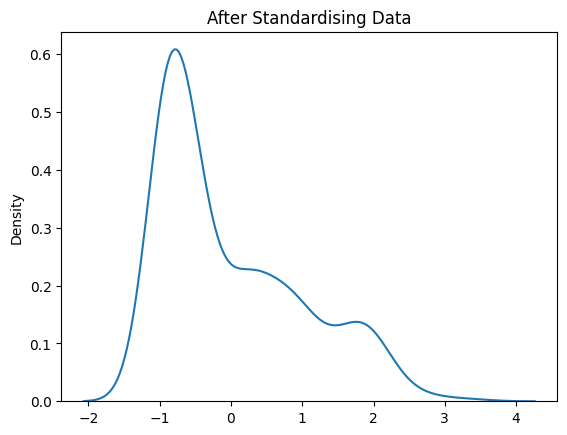

In [74]:
sns.kdeplot(data=scale.flatten())
plt.title("After Standardising Data")

Still skewness not reduced so we will go with log and other transformations so before that we will go and check with ADF test the stationarity then we will proceed further

### ***ADF Test***

#### ***Test for stationarity***

In [75]:
from scipy.stats.distributions import chi2
import statsmodels.tsa.stattools as sts

In [76]:
sts.adfuller(Train["price"])

(-1.7027645927580817,
 0.4296886413828878,
 5,
 394,
 {'1%': -3.4470566389664703,
  '5%': -2.8689037160476016,
  '10%': -2.570692663557422},
 2234.4971083856167)

In [77]:
def adf_test(Data):
  result=sts.adfuller(Data)
  ''' perform Augmented Dickey Fuller Test on Given Data Set'''
  labels=["ADF test statistic","p-value","# lags used","# obsesrvations"]
  out = pd.Series(result[0:4], index=labels)

  if result[1]<=0.05:
      print('The time series is likely stationary.')
      print(out)
  else:
      print('The time series is likely non-stationary.')
      print(out)

In [78]:
adf_test(Train["price"])

The time series is likely non-stationary.
ADF test statistic     -1.702765
p-value                 0.429689
# lags used             5.000000
# obsesrvations       394.000000
dtype: float64


**H0**: Not stationary

**H1**:Stationary

**but here p value is 0.429 so higher than alpha which we bydefault cosider as 0.05 so Data is Not stationary.We need some transformations.**

### ***Let's make new dataframe for transform.***
We will check stability and its plot after standardisation and other transformations
It will not do any improvement for stationarity still we will check for it.

In [79]:
Transform=pd.DataFrame()

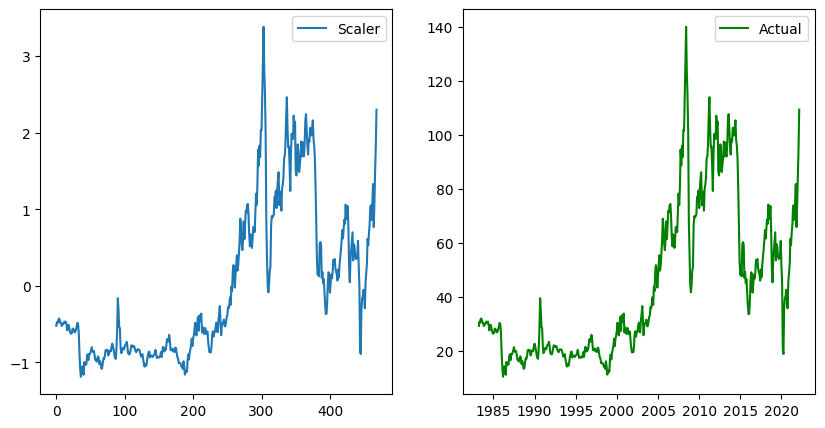

In [80]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(scale,label="Scaler")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='g')
plt.legend(loc="best")

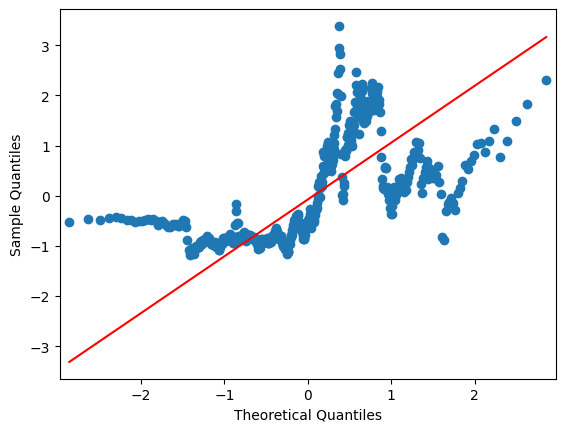

In [81]:
sm.qqplot(scale,line='q')
py.show()

In [82]:
adf_test(scale)

The time series is likely non-stationary.
ADF test statistic     -1.780108
p-value                 0.390381
# lags used             1.000000
# obsesrvations       467.000000
dtype: float64


### ***LOG Transform***

In [83]:
k=np.log(OILDATA["price"])

In [84]:
Transform["Log"]=k

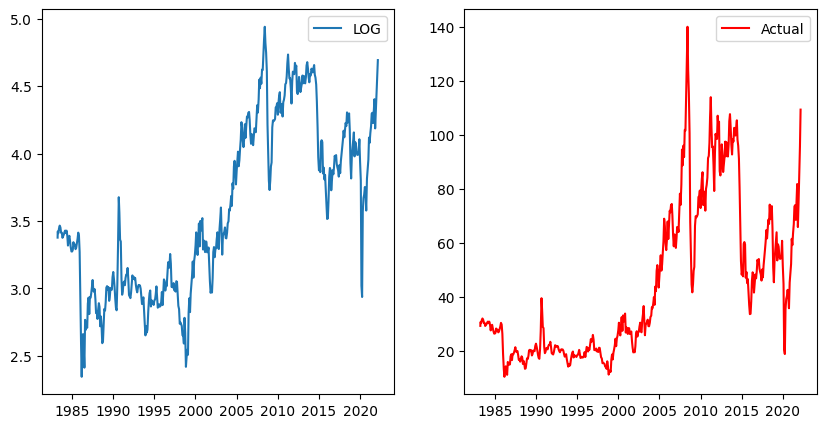

In [85]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(Transform["Log"],label="LOG")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='r')
plt.legend(loc="best")

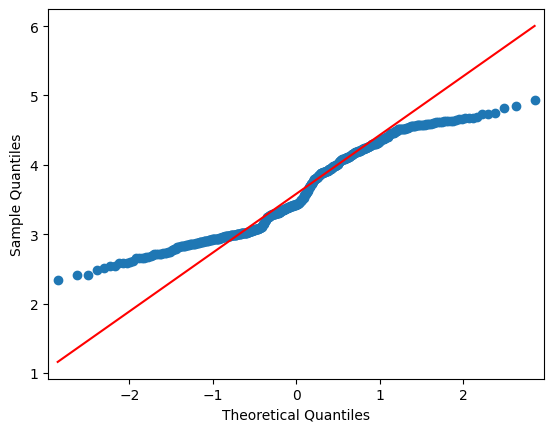

In [86]:
sm.qqplot(Transform["Log"],line='q')
py.show()

Text(0.5, 1.0, 'After log(ln) transformation')

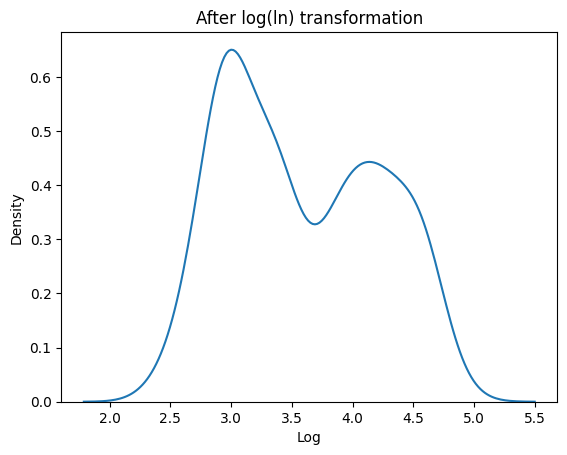

In [87]:
sns.kdeplot(data=Transform["Log"])
plt.title("After log(ln) transformation")

In [88]:
sts.adfuller(Transform["Log"])

(-1.325236247981207,
 0.6175490845701669,
 4,
 464,
 {'1%': -3.4445220811896657,
  '5%': -2.8677891615873192,
  '10%': -2.5700985643950656},
 -740.903649136869)

In [89]:
adf_test(Transform["Log"])

The time series is likely non-stationary.
ADF test statistic     -1.325236
p-value                 0.617549
# lags used             4.000000
# obsesrvations       464.000000
dtype: float64


### ***Differencing Log Transformations***

In [90]:
difLog=Transform["Log"]-Transform["Log"].shift()
difLog.dropna(inplace=True)

In [91]:
Transform["LOGDif"]=difLog

In [92]:
Transform["LOGDif"]

date
1983-03-30         NaN
1983-04-04    0.045417
1983-05-02   -0.012484
1983-06-01    0.036675
1983-07-01    0.019565
                ...   
2021-11-01   -0.216653
2021-12-01    0.128507
2022-01-03    0.144142
2022-02-01    0.101398
2022-03-01    0.132944
Name: LOGDif, Length: 469, dtype: float64

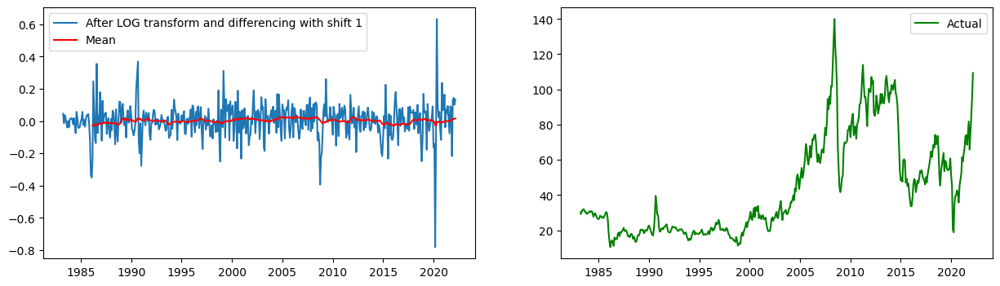

In [93]:
plt.figure(figsize=(15,4))
plt.subplot(121)
plt.plot(difLog,label="After LOG transform and differencing with shift 1")
plt.legend(loc="best")
rolling_mean=Transform["LOGDif"].rolling(window=36).mean()
plt.plot(rolling_mean,c='r',label="Mean")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='g')
plt.legend(loc="best")
plt.show()

Text(0.5, 1.0, 'After LOG and Differencing it')

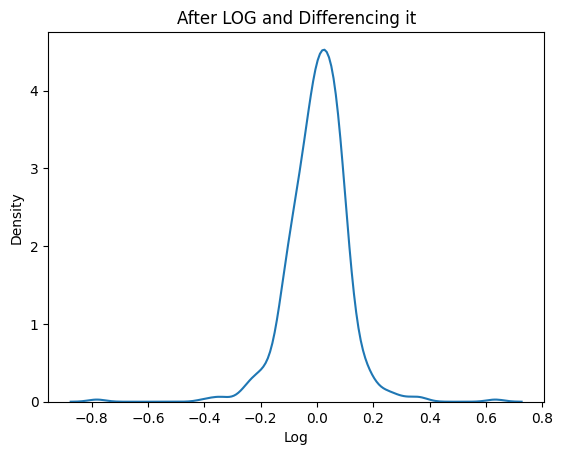

In [94]:
sns.kdeplot(data=difLog)
plt.title("After LOG and Differencing it")

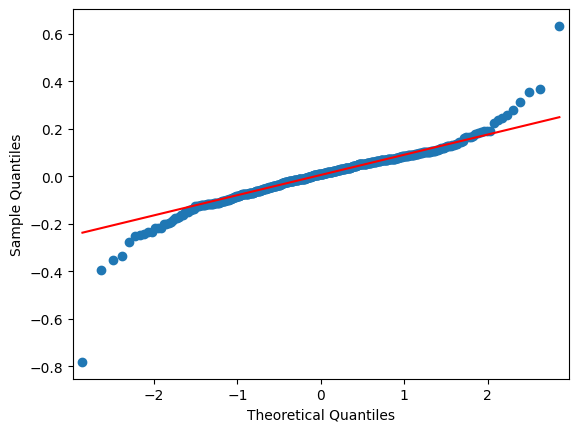

In [95]:
sm.qqplot(difLog,line='q')
py.show()

In [96]:
adf_test(difLog)

The time series is likely stationary.
ADF test statistic   -1.195567e+01
p-value               4.215645e-22
# lags used           3.000000e+00
# obsesrvations       4.640000e+02
dtype: float64


### ***SQRT Transformations***

In [97]:
s=np.sqrt(OILDATA["price"])

In [98]:
Transform["Sqrt"]=s

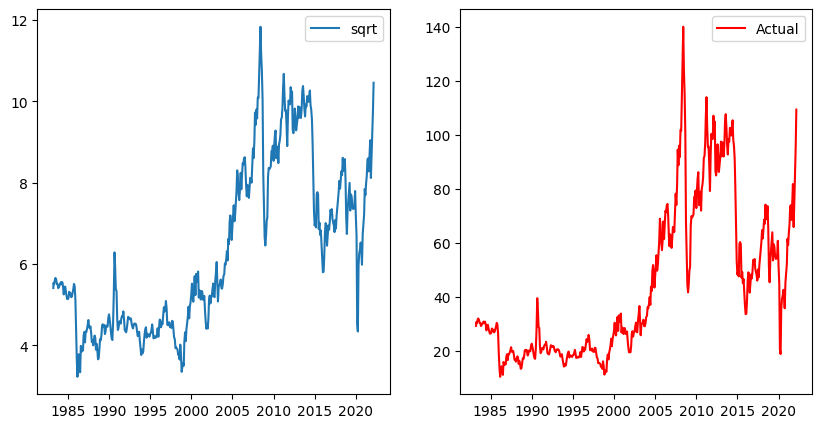

In [99]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(Transform["Sqrt"],label="sqrt")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='r')
plt.legend(loc="best")

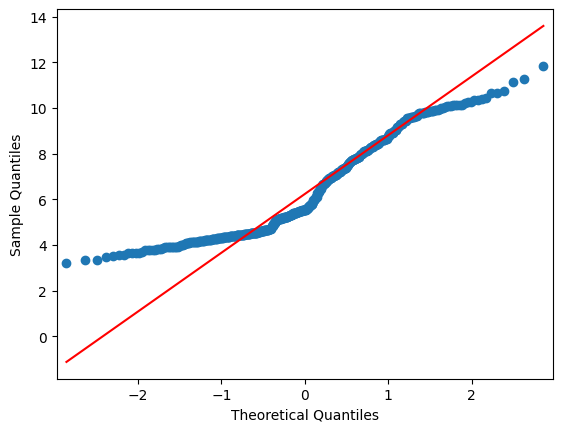

In [100]:
sm.qqplot(Transform["Sqrt"],line='q')
py.show()

Text(0.5, 1.0, 'After Square Root transformation')

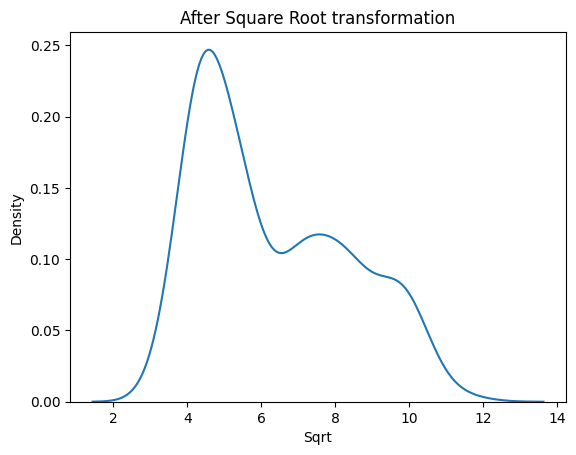

In [101]:
sns.kdeplot(data=Transform["Sqrt"])
plt.title("After Square Root transformation")

In [102]:
adf_test(Transform["Sqrt"])

The time series is likely non-stationary.
ADF test statistic     -1.662033
p-value                 0.450773
# lags used             1.000000
# obsesrvations       467.000000
dtype: float64


### ***Exponential transformation***

In [103]:
Transform["Exp"]=np.exp(OILDATA["price"])

Text(0.5, 1.0, 'After exponential transformation')

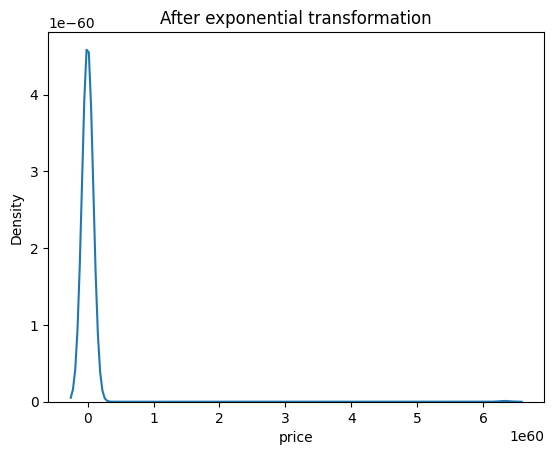

In [104]:
sns.kdeplot(data=np.exp(OILDATA["price"]))
plt.title("After exponential transformation")

In [105]:
import statsmodels.api as sm
import pylab as py

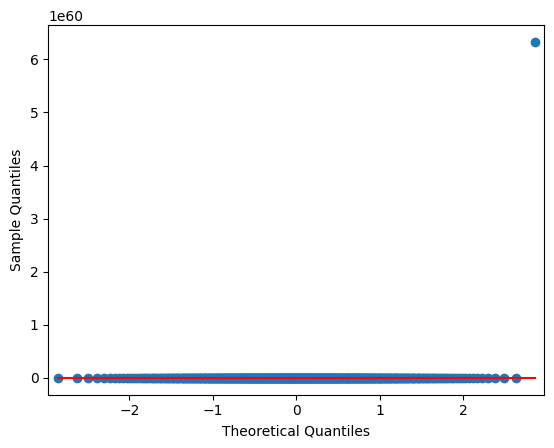

In [106]:
sm.qqplot(np.exp(OILDATA["price"]),line='q')
py.show()

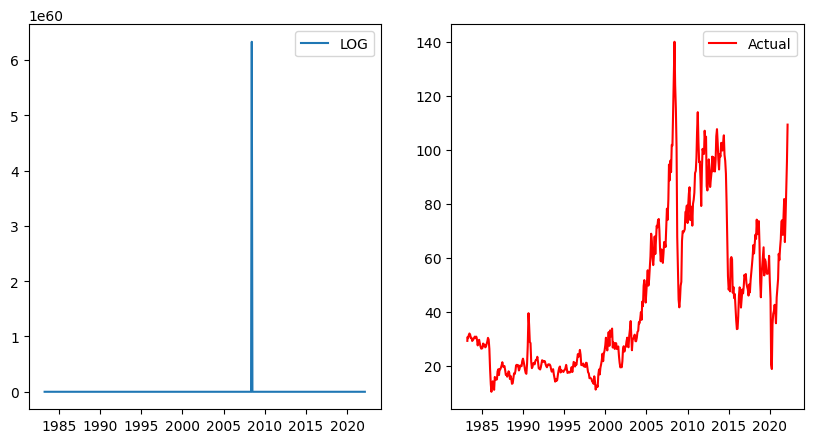

In [107]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(np.exp(OILDATA["price"]),label="LOG")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='r')
plt.legend(loc="best")

In [108]:
adf_test(np.exp(OILDATA["price"]))

The time series is likely stationary.
ADF test statistic    -21.610111
p-value                 0.000000
# lags used             0.000000
# obsesrvations       468.000000
dtype: float64


### ***Inverse Transformations***

In [109]:
INVERSE=1/OILDATA["price"]

In [110]:
Transform["Inverse"]=INVERSE

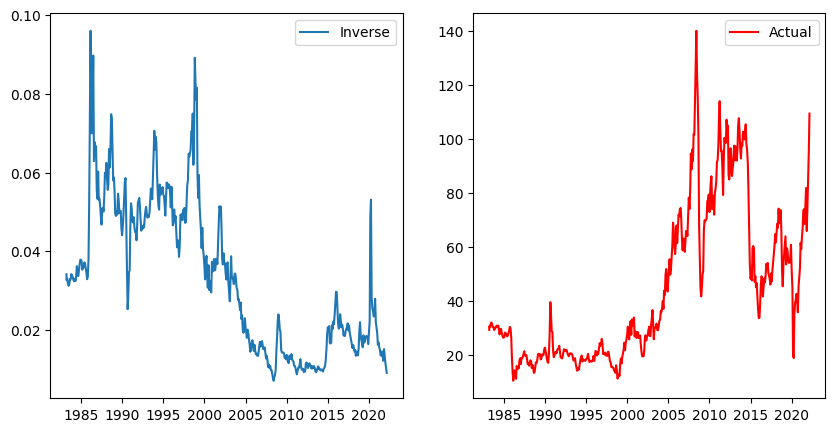

In [111]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(Transform["Inverse"],label="Inverse")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='r')
plt.legend(loc="best")

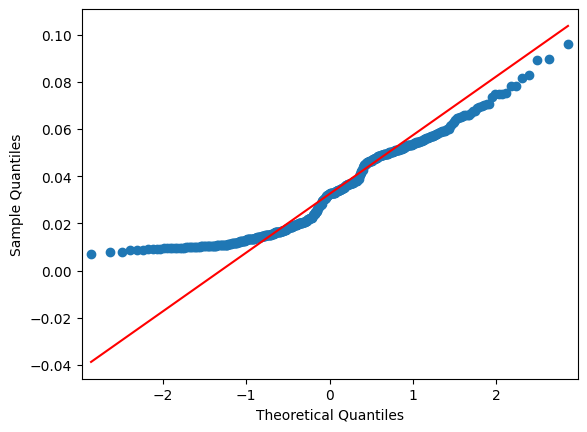

In [112]:
sm.qqplot(INVERSE,line='q')
py.show()

<Axes: xlabel='price', ylabel='Density'>

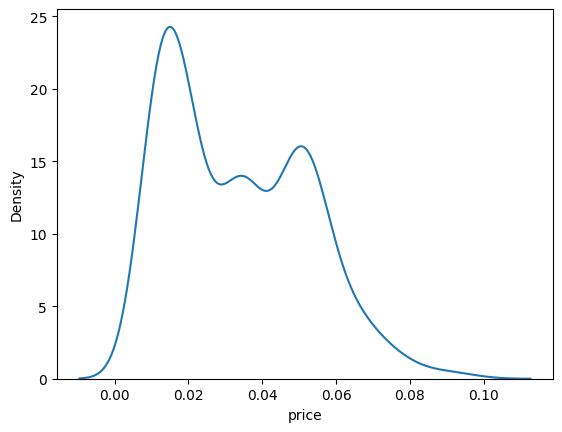

In [113]:
sns.kdeplot(data=INVERSE)

In [114]:
adf_test(INVERSE)

The time series is likely non-stationary.
ADF test statistic     -1.784550
p-value                 0.388159
# lags used             5.000000
# obsesrvations       463.000000
dtype: float64


### ***BOXCOX Transformation***

A common transformation for stabilizing data with increasing variance over time is the Box-Cox transformation.

The Box-Cox transformation is a family of power transformations that can be applied to the data to stabilize its variance. It involves a parameter lambda that determines the type of transformation to apply. When lambda is 1, the transformation is a natural log transformation, which is similar to what you've applied already. When lambda is not equal to 1, the transformation is a power transformation that can be used to stabilize data with non-constant variance

In [115]:
from scipy.stats import boxcox
boxcox,lambda_=boxcox(OILDATA["price"])

In [116]:
 lambda_

-0.22723015773717262

In [117]:
Transform["BOXCOX"]=pd.Series( boxcox,index=OILDATA.index)

In [118]:
Transform

,Log,LOGDif,Sqrt,Exp,Inverse,BOXCOX
date,,,,,,
1983-03-30,3.376563,NaN,5.410176,5.149908e+12,0.034165,2.357588
1983-04-04,3.421980,0.045417,5.534438,2.006504e+13,0.032648,2.378566
1983-05-02,3.409496,-0.012484,5.500000,1.372170e+13,0.033058,2.372821
1983-06-01,3.446171,0.036675,5.601785,4.247769e+13,0.031867,2.389652
1983-07-01,3.465736,0.019565,5.656854,7.896296e+13,0.031250,2.398573
...,...,...,...,...,...,...
2021-11-01,4.187379,-0.216653,8.114801,3.965442e+28,0.015186,2.701394
2021-12-01,4.315887,0.128507,8.653323,3.311089e+32,0.013355,2.750301
2022-01-03,4.460029,0.144142,9.300000,3.648629e+37,0.011562,2.803486


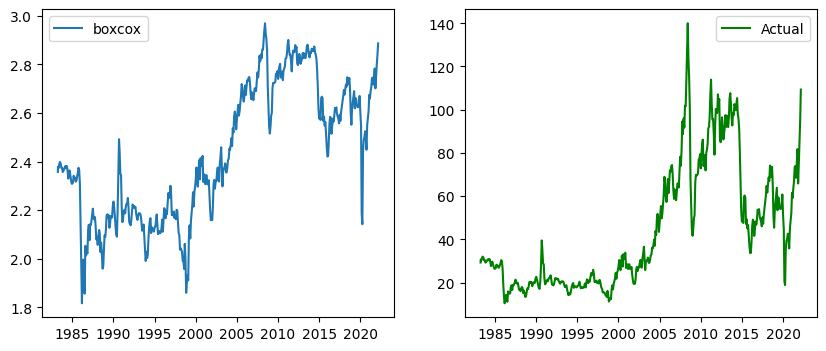

In [119]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.plot(Transform["BOXCOX"],label="boxcox")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='g')
plt.legend(loc="best")

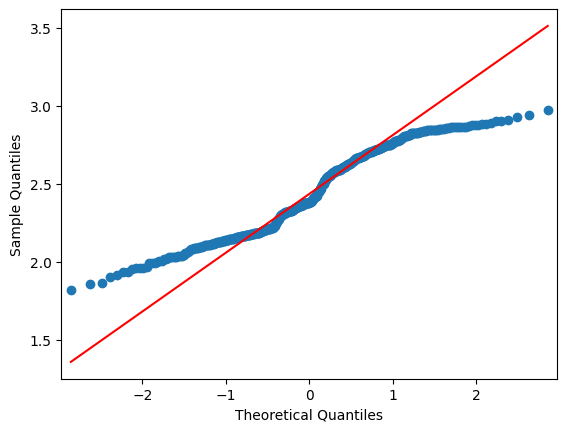

In [120]:
sm.qqplot(Transform["BOXCOX"],line='q')
py.show()

Text(0.5, 1.0, 'After BOXCOX Transformation(lmda=-0.227..)')

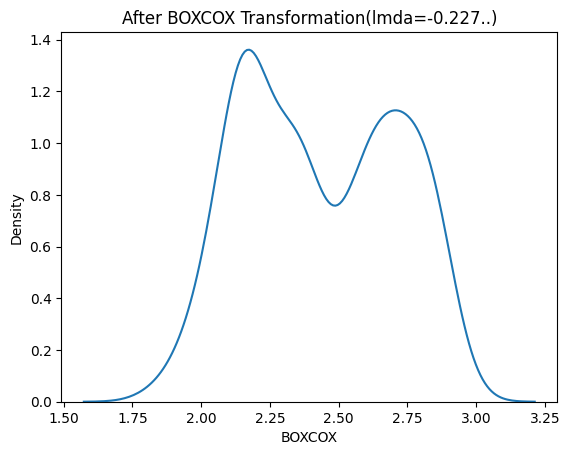

In [121]:
sns.kdeplot(data=Transform["BOXCOX"])
plt.title("After BOXCOX Transformation(lmda=-0.227..)")

In [122]:
adf_test(Transform["BOXCOX"])

The time series is likely non-stationary.
ADF test statistic     -1.408125
p-value                 0.578375
# lags used             4.000000
# obsesrvations       464.000000
dtype: float64


### ***Differencing BOXCOX Transformations***

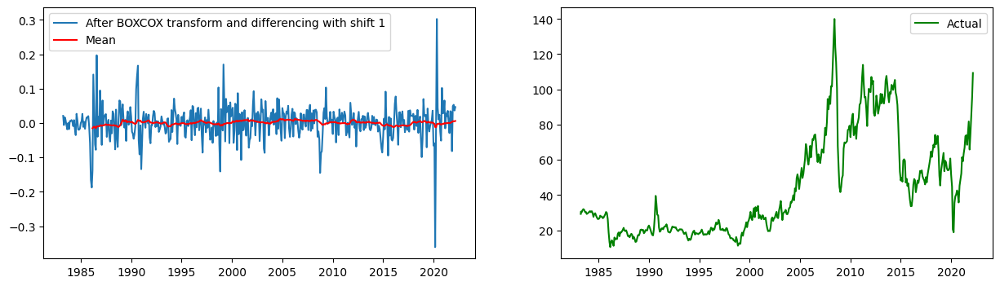

In [123]:
difboxcox=Transform["BOXCOX"]-Transform["BOXCOX"].shift()
difboxcox.dropna(inplace=True)
plt.figure(figsize=(15,4))
plt.subplot(121)
plt.plot(difboxcox,label="After BOXCOX transform and differencing with shift 1")
plt.legend(loc="best")
rolling_mean=difboxcox.rolling(window=36).mean()
plt.plot(rolling_mean,c='r',label="Mean")
plt.legend(loc="best")
plt.subplot(122)
plt.plot(OILDATA["price"],label="Actual",c='g')
plt.legend(loc="best")
plt.show()

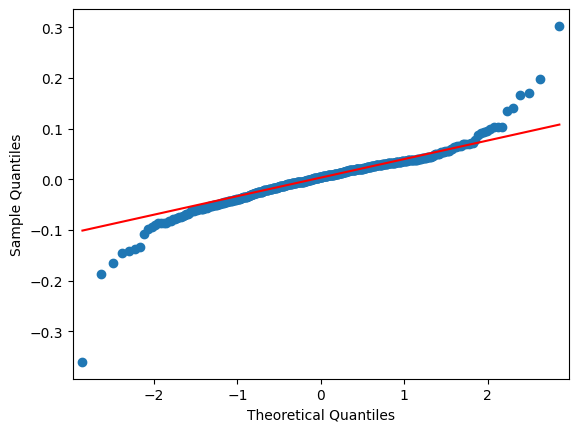

In [124]:
sm.qqplot(difboxcox,line='q')
py.show()

In [125]:
Transform["DiffBoxcox"]=difboxcox

In [126]:
Transform

,Log,LOGDif,Sqrt,Exp,Inverse,BOXCOX,DiffBoxcox
date,,,,,,,
1983-03-30,3.376563,NaN,5.410176,5.149908e+12,0.034165,2.357588,NaN
1983-04-04,3.421980,0.045417,5.534438,2.006504e+13,0.032648,2.378566,0.020978
1983-05-02,3.409496,-0.012484,5.500000,1.372170e+13,0.033058,2.372821,-0.005745
1983-06-01,3.446171,0.036675,5.601785,4.247769e+13,0.031867,2.389652,0.016830
1983-07-01,3.465736,0.019565,5.656854,7.896296e+13,0.031250,2.398573,0.008921
...,...,...,...,...,...,...,...
2021-11-01,4.187379,-0.216653,8.114801,3.965442e+28,0.015186,2.701394,-0.081637
2021-12-01,4.315887,0.128507,8.653323,3.311089e+32,0.013355,2.750301,0.048907
2022-01-03,4.460029,0.144142,9.300000,3.648629e+37,0.011562,2.803486,0.053185


So we got transformation after Differencing BOXCOX

Text(0.5, 1.0, 'After DIff BoxCOx')

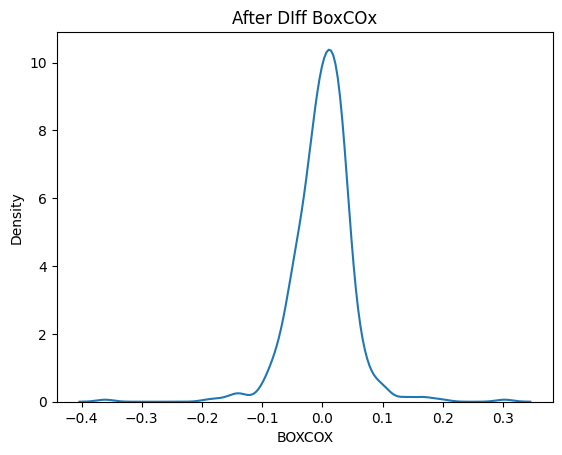

In [127]:
sns.kdeplot(data=difboxcox)
plt.title("After DIff BoxCOx")

In [128]:
adf_test(difboxcox)

The time series is likely stationary.
ADF test statistic   -1.126417e+01
p-value               1.594655e-20
# lags used           4.000000e+00
# obsesrvations       4.630000e+02
dtype: float64


## ***AR MA ARIMA Models***

### ***LLR (Log Likelihood Ratiou)***

LLR = -2 * (log-likelihood of Model 1 - log-likelihood of Model 2) **bold text**


The Log-Likelihood Ratio (LLR) test is a statistical test used in forecasting to assess the adequacy of a model. It is based on comparing the log-likelihoods of two competing models to determine which one provides a better fit to the data.

Here's how the LLR test works in forecasting:

1.)Define competing models: Start by specifying two competing models that you want to compare. These models should represent different hypotheses or assumptions about the underlying data generating process.

2.)Estimate the models: Estimate the parameters of each model using a suitable estimation technique, such as maximum likelihood estimation.

3.)Calculate the log-likelihoods: Compute the log-likelihood for each model using the estimated parameters. The log-likelihood measures the goodness of fit of the model to the observed data.

4.)Calculate the LLR test statistic: The LLR test statistic is calculated as the difference between the log-likelihoods of the two models multiplied by -2. Mathematically, LLR = -2 * (log-likelihood of Model 1 - log-likelihood of Model 2).

5.)Perform hypothesis testing: Assess the statistical significance of the LLR test statistic. This involves comparing the computed test statistic with the critical values from the chi-square distribution at a given significance level (e.g., 0.05 or 0.01). If the computed test statistic exceeds the critical value, you reject the null hypothesis, indicating that one model provides a significantly better fit than the other.

6.)Interpretation: If the LLR test indicates a significant difference between the two models, you can conclude that one model is superior to the other in terms of its ability to explain the observed data. This information can help you select the most appropriate model for forecasting.

7.)It's worth noting that the LLR test assumes that the models being compared are nested, meaning that one model is a special case of the other. Additionally, the LLR test can be used in various forecasting contexts, such as comparing different time series models, comparing different nonlinear regression models, or evaluating the significance of adding or removing variables from a model.

Overall, the LLR test is a valuable tool for model selection and hypothesis testing in forecasting, allowing you to make more informed decisions based on the fit of competing models to the available data.

L(θ|X) = ln( f(X|θ) ),

where f(X|θ) is the probability density function (PDF) or probability mass function (PMF) of the model, depending on whether the data is continuous or discrete.

The log-likelihood of a model is a measure of how well the model fits the observed data. It quantifies the probability of observing the given data, assuming that the model's parameters are correctly estimated.

### **For best order values**

In [129]:
def LLR_test(ARmodel_1,ARmodel_2,DF=1):
    L1=ARmodel_1.fit().llf
    L2=ARmodel_2.fit().llf
    LR=(2*(L2-L1))
    p=chi2.sf(LR,DF).round(3)
    return p

H0:No improvement(p> alpha)

H1:Significant improvement(p<alpha)

Hypothesis condition for LLR Test

### ***We will check ACF and PACF For LOG Diff.***

## ***AR Model***

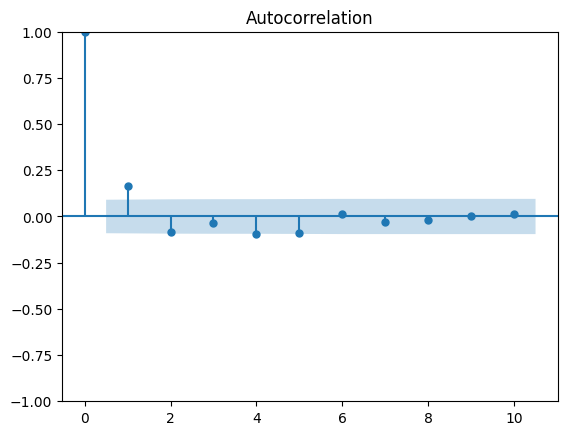

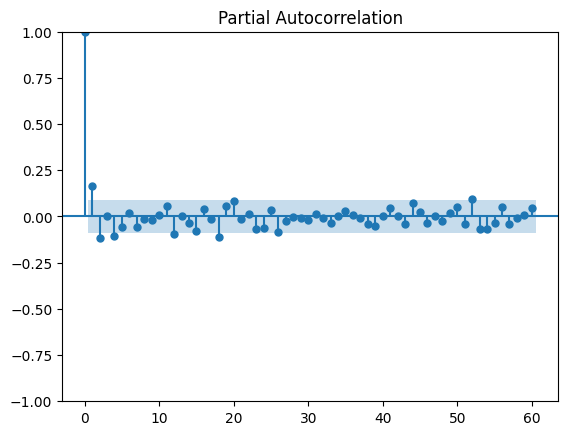

In [130]:
tsa_plots.plot_acf(difLog,lags=10)
tsa_plots.plot_pacf(difLog,lags=60)
plt.show()

From previous PACF Order for AR is 3 so Let us do for LLR

**AR 1 WITH ORDER 2(ARIMA WITH ORDER(P,0,0) IS EQVALENT TO AR MODEL)**

In [131]:
from statsmodels.tsa.arima.model import ARIMA

In [132]:
Trn=Transform.iloc[:390]
Tst=Transform.iloc[390:]

In [133]:
Transform

,Log,LOGDif,Sqrt,Exp,Inverse,BOXCOX,DiffBoxcox
date,,,,,,,
1983-03-30,3.376563,NaN,5.410176,5.149908e+12,0.034165,2.357588,NaN
1983-04-04,3.421980,0.045417,5.534438,2.006504e+13,0.032648,2.378566,0.020978
1983-05-02,3.409496,-0.012484,5.500000,1.372170e+13,0.033058,2.372821,-0.005745
1983-06-01,3.446171,0.036675,5.601785,4.247769e+13,0.031867,2.389652,0.016830
1983-07-01,3.465736,0.019565,5.656854,7.896296e+13,0.031250,2.398573,0.008921
...,...,...,...,...,...,...,...
2021-11-01,4.187379,-0.216653,8.114801,3.965442e+28,0.015186,2.701394,-0.081637
2021-12-01,4.315887,0.128507,8.653323,3.311089e+32,0.013355,2.750301,0.048907
2022-01-03,4.460029,0.144142,9.300000,3.648629e+37,0.011562,2.803486,0.053185


In [134]:
ARmodel_1=ARIMA(Trn["LOGDif"],order=(2,0,0))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [135]:
AR1RESULT=ARmodel_1.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [136]:
AR1RESULT.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 LOGDif   No. Observations:                  390
Model:                 ARIMA(2, 0, 0)   Log Likelihood                 369.722
Date:                Sun, 23 Jul 2023   AIC                           -731.443
Time:                        07:01:55   BIC                           -715.579
Sample:                             0   HQIC                          -725.154
                                - 390                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0014      0.006      0.249      0.804      -0.010       0.012
ar.L1          0.1793      0.040      4.490      0.000       0.101       0.258
ar.L2         -0.0490      0.042     -1.155      0.248      -0.132       0.034
sigma2         0.0087      0.000     19.420      0.000       0.008       0.010
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                67.33
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.90   Skew:                            -0.01
Prob(H) (two-sided):                  0.56   Kurtosis:                         5.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""


## **AR 2 Model**

In [137]:
ARmodel_2=ARIMA(Trn["LOGDif"],order=(3,0,0))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [138]:
AR2RESULT=ARmodel_2.fit()

In [139]:
AR2RESULT.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 LOGDif   No. Observations:                  390
Model:                 ARIMA(3, 0, 0)   Log Likelihood                 369.770
Date:                Sun, 23 Jul 2023   AIC                           -729.539
Time:                        07:01:55   BIC                           -709.709
Sample:                             0   HQIC                          -721.678
                                - 390                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0014      0.006      0.244      0.807      -0.010       0.013
ar.L1          0.1801      0.040      4.491      0.000       0.102       0.259
ar.L2         -0.0519      0.047     -1.111      0.267      -0.144       0.040
ar.L3          0.0158      0.049      0.323      0.747      -0.080       0.112
sigma2         0.0087      0.000     19.407      0.000       0.008       0.010
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                66.88
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.90   Skew:                            -0.01
Prob(H) (two-sided):                  0.56   Kurtosis:                         5.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [140]:
LLR_test(ARmodel_1,ARmodel_2,DF=1)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


0.757

**Higher value we get as p > alpha so we failed to reject null hypothesis and we conclude that AR model according to PACF we will  Keep as 2**

**So we will analayse the residual for Model**

In [141]:
Trn["AR_resid"]=AR1RESULT.resid

In [142]:
Trn["AR_resid"]

date
1983-03-30         NaN
1983-04-04    0.044013
1983-05-02   -0.021412
1983-06-01    0.039918
1983-07-01    0.011156
                ...   
2015-04-01    0.233583
2015-05-01   -0.032628
2015-06-01   -0.006044
2015-07-01   -0.230963
2015-08-03    0.083038
Name: AR_resid, Length: 390, dtype: float64

In [143]:
Trn.AR_resid.mean()

-1.5508350299686554e-05

In [144]:
Trn.AR_resid.var()

0.008771427324964364

**from above resid and mean not high its too less so its good**

Mean=0

constant variance

Normal Disstribution

No Autocorelation

### **Residuals Must be stationary**

In [145]:
Trn["AR_resid"]

date
1983-03-30         NaN
1983-04-04    0.044013
1983-05-02   -0.021412
1983-06-01    0.039918
1983-07-01    0.011156
                ...   
2015-04-01    0.233583
2015-05-01   -0.032628
2015-06-01   -0.006044
2015-07-01   -0.230963
2015-08-03    0.083038
Name: AR_resid, Length: 390, dtype: float64

In [146]:
resid=Trn["AR_resid"].iloc[1:]

In [147]:
adf_test(resid)

The time series is likely stationary.
ADF test statistic    -19.61039
p-value                 0.00000
# lags used             0.00000
# obsesrvations       388.00000
dtype: float64


**p value 0 and H1: data stationary so accept alternate hypothesis.So constant variance and no pattern in the Data.**

In [148]:
resid

date
1983-04-04    0.044013
1983-05-02   -0.021412
1983-06-01    0.039918
1983-07-01    0.011156
1983-08-01   -0.015828
                ...   
2015-04-01    0.233583
2015-05-01   -0.032628
2015-06-01   -0.006044
2015-07-01   -0.230963
2015-08-03    0.083038
Name: AR_resid, Length: 389, dtype: float64

## **ACF among residuals(should be less or NO)**

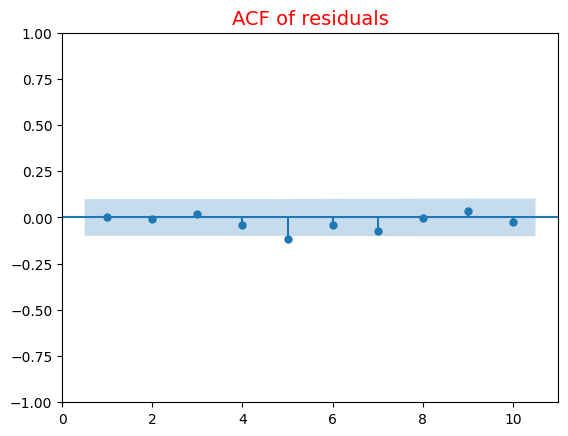

In [149]:
tsa_plots.plot_acf(resid,zero=False,lags=10)
plt.title("ACF of residuals",c='r',size=14)
plt.show()

No significant ACF specially on lags we considered for AR models for order 2.

### ***Residuals must be random***

Text(0.5, 1.0, 'Resid is normally distributed')

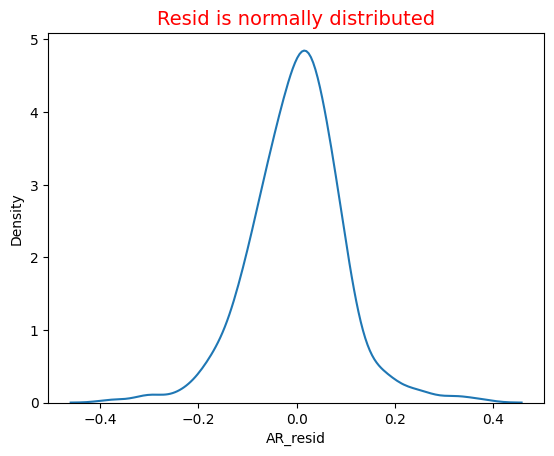

In [150]:
sns.kdeplot(data=resid)
plt.title("Resid is normally distributed",c='r',size=14)

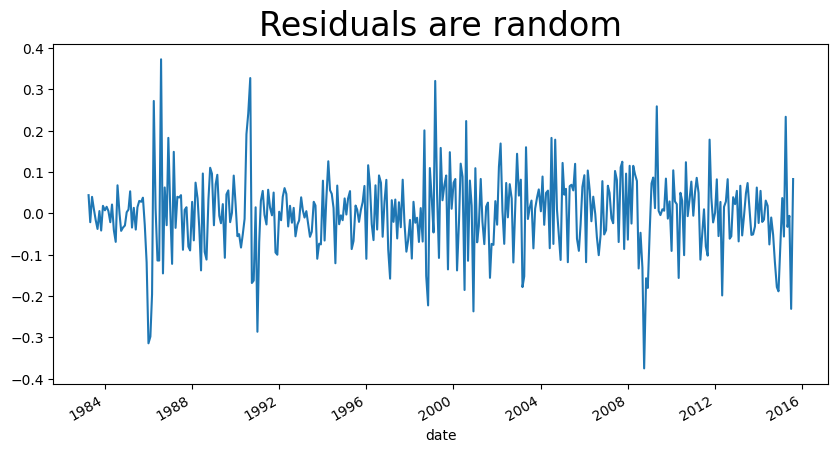

In [151]:
resid.plot(figsize=(10,5))
plt.title("Residuals are random",size=24)
plt.show()

**residual is random and no pattern its how the noise looks like so our model is good.**

**And mean of ressid also nearly zero can observe from above plot.**

**No significant ACF specially on lags we considered for AR models for order 2.**

## **AR model RMSE with test dat**a

In [152]:
Tst["LOGDif"]

date
2015-09-01   -0.087233
2015-10-01    0.032725
2015-11-02   -0.112085
2015-12-01   -0.117303
2016-01-01   -0.096877
                ...   
2021-11-01   -0.216653
2021-12-01    0.128507
2022-01-03    0.144142
2022-02-01    0.101398
2022-03-01    0.132944
Name: LOGDif, Length: 79, dtype: float64

In [153]:
ARmodel=ARIMA(Tst["LOGDif"],order=(2,0,0))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [154]:
ARRESULT=ARmodel.fit()

In [155]:
start_value = pd.to_datetime('2015-09-01')
end_value = pd.to_datetime('2022-03-01')

In [156]:
start_index = Tst["LOGDif"].index.get_loc(start_value)
end_index = Tst["LOGDif"].index.get_loc(end_value)

In [157]:
PredictedAr=ARRESULT.predict(satart=start_index, end=end_index )

In [158]:
#PredictedAr

In [159]:
#PredictedAr=Tst.LOGDif.iloc[-1]+PredictedAr.cumsum()

In [160]:
#PredictedAr=np.exp(PredictedAr)

In [161]:
#PredictedAr

In [162]:
#AR_mse = np.mean((Test["price"] - PredictedAr)**2)

In [163]:
#AR_rmse = np.sqrt(AR_mse)
#AR_rmse

In [164]:
testPredictar=PredictedAr

In [165]:
testPredictarlist = []
testPredictarlist.append(Tst.Log[0])  # Initialize with the first value of the log-transformed series

for i in range(1, len(Tst)):
    testPredictarlist.append(testPredictarlist[i-1] + testPredictar[i-1])

testPredictar = np.array(testPredictarlist)
testPredictar = np.exp(testPredictar)

In [166]:
Tst['AR']=testPredictar
Tst['AR']

date
2015-09-01     45.090000
2015-10-01     45.530720
2015-11-02     45.316335
2015-12-01     47.135692
2016-01-01     46.240913
                 ...    
2021-11-01     96.982507
2021-12-01     97.259482
2022-01-03     92.261048
2022-02-01    101.065784
2022-03-01    101.467890
Name: AR, Length: 79, dtype: float64

In [167]:
AR_rmse=np.sqrt(np.mean(OILDATA.iloc[390:,0]-testPredictar)**2)
AR_rmse

14.381125583957644

## ***MA Model***

**above ACF graph we got MA order q as 2 so let us buid model to confirm the order accurately.**

In [168]:
MAmodel_1=ARIMA(Trn["LOGDif"],order=(0,0,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [169]:
MAresult1=MAmodel_1.fit()

In [170]:
MAresult1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 LOGDif   No. Observations:                  390
Model:                 ARIMA(0, 0, 2)   Log Likelihood                 369.816
Date:                Sun, 23 Jul 2023   AIC                           -731.632
Time:                        07:01:58   BIC                           -715.767
Sample:                             0   HQIC                          -725.343
                                - 390                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0014      0.006      0.246      0.806      -0.010       0.013
ma.L1          0.1809      0.040      4.540      0.000       0.103       0.259
ma.L2         -0.0234      0.042     -0.556      0.578      -0.106       0.059
sigma2         0.0087      0.000     19.416      0.000       0.008       0.010
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                66.92
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.90   Skew:                            -0.01
Prob(H) (two-sided):                  0.56   Kurtosis:                         5.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [171]:
MAmodel_2=ARIMA(Trn["LOGDif"],order=(0,0,3))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [172]:
MAresult2=MAmodel_2.fit()

In [173]:
MAresult2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 LOGDif   No. Observations:                  390
Model:                 ARIMA(0, 0, 3)   Log Likelihood                 369.834
Date:                Sun, 23 Jul 2023   AIC                           -729.669
Time:                        07:01:58   BIC                           -709.838
Sample:                             0   HQIC                          -721.808
                                - 390                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0014      0.006      0.242      0.809      -0.010       0.013
ma.L1          0.1811      0.040      4.525      0.000       0.103       0.260
ma.L2         -0.0193      0.042     -0.457      0.648      -0.102       0.064
ma.L3          0.0107      0.042      0.256      0.798      -0.072       0.093
sigma2         0.0087      0.000     19.366      0.000       0.008       0.010
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                66.07
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.90   Skew:                            -0.01
Prob(H) (two-sided):                  0.55   Kurtosis:                         5.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [174]:
LLR_test(MAmodel_1,MAmodel_2,DF=1)

0.847

P>alpha so null hypothesis is failed to reject and no improvement from 2 to 3 so MA model q order we will finalise as 2.

In [175]:
Trn['MA_resid']=MAresult1.resid

In [176]:
Trn.MA_resid.mean()

-1.2489869424375386e-05

In [177]:
Trn.MA_resid.var()

0.008767151220383866

from above resid and mean not high its too less so its good

 Residuals of model should follow-->:

Mean=0

constant variance

Normal Disstribution

No Autocorelation

### **Residuals Must be stationary**

In [178]:
maresid=Trn.MA_resid.dropna()

In [179]:
adf_test(maresid)

The time series is likely stationary.
ADF test statistic    -19.629864
p-value                 0.000000
# lags used             0.000000
# obsesrvations       388.000000
dtype: float64


p - value nearly zero so it is stationary.

### **ACF among residuals**

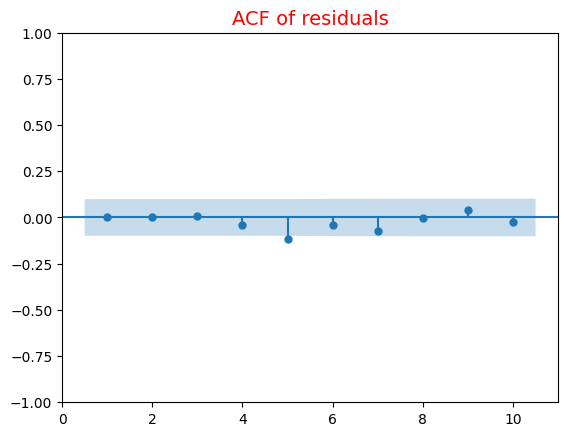

In [180]:
tsa_plots.plot_acf(maresid,zero=False,lags=10)
plt.title("ACF of residuals",c='r',size=14)
plt.show()

No significant ACF specially on lags we considered for AR models for order 2.

**Residuals must be random.**

Text(0.5, 1.0, 'Resid is normally distributed')

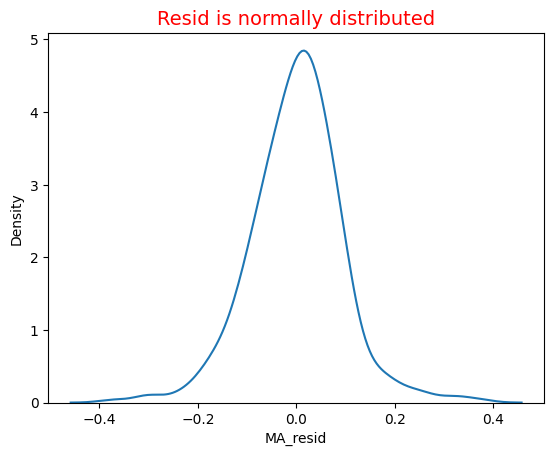

In [181]:
sns.kdeplot(data=Trn.MA_resid)
plt.title("Resid is normally distributed",c='r',size=14)

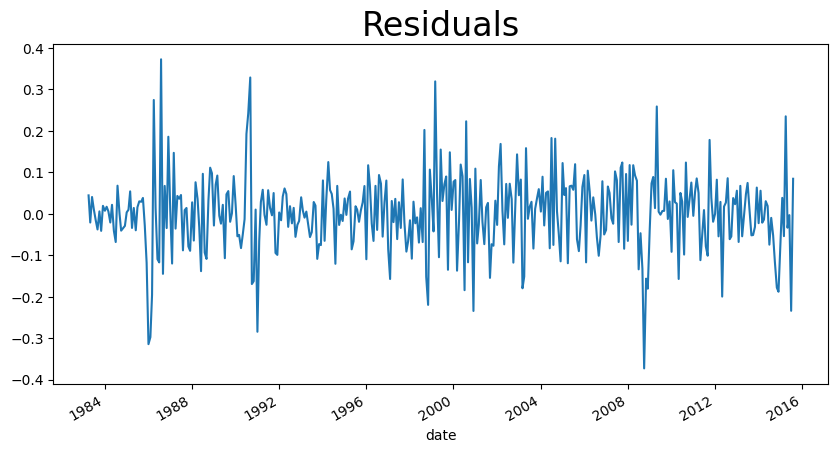

In [182]:
Trn.MA_resid.plot(figsize=(10,5))
plt.title("Residuals",size=24)
plt.show()

residual is random and no pattern its how the noise looks like so our model is good.

And mean of ressid also nearly zero can observe from above plot.

No significant ACF specially on lags we considered for MA models for order 2.

## **MA Model performance with Test data**

In [183]:
MAmodel=ARIMA(Trn["LOGDif"],order=(0,0,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [184]:
MAresult=MAmodel.fit()

In [185]:
start_value = pd.to_datetime('2015-09-01')
end_value = pd.to_datetime('2022-03-01')

In [186]:
start_index = Tst["LOGDif"].index.get_loc(start_value)
end_index = Tst["LOGDif"].index.get_loc(end_value)

In [187]:
Predictedma=MAresult.predict(satart=start_index, end=end_index)

In [188]:
#Predictedma=np.exp(Predictedma)

In [189]:
#Predictedma=Tst.LOGDif.iloc[-1]+Predictedma.cumsum()

In [190]:
#MA_mse = np.mean((Test["price"] - Predictedma)**2)

In [191]:
#MA_rmse=np.sqrt(MA_mse)

In [192]:
#MA_mse

In [193]:
#MA_rmse

In [194]:
testPredictma=Predictedma

In [195]:
testPredictmalist = []
testPredictmalist.append(Tst.Log[0])  # Initialize with the first value of the log-transformed series

for i in range(1, len(Tst)):
    testPredictmalist.append(testPredictmalist[i-1] + testPredictma[i-1])

testPredictma = np.array(testPredictmalist)
testPredictma = np.exp(testPredictma)

In [196]:
testPredictma

array([45.09      , 45.15311012, 45.21630858, 45.6217138 , 45.46430125,
       45.88255907, 45.99012714, 45.91650691, 45.68108977, 45.83122704,
       45.54587086, 45.8097942 , 45.9116155 , 46.10675075, 46.19952518,
       46.08009293, 46.34549502, 46.04106796, 45.58242904, 46.28035296,
       46.26706055, 45.98991767, 45.80557639, 45.66324157, 45.78453733,
       45.92324156, 46.42627919, 46.14385934, 46.36036488, 46.07450044,
       46.31165463, 46.60908809, 46.88382106, 47.24047648, 47.02126895,
       46.11815237, 43.74771881, 41.81710025, 40.70051327, 43.02684029,
       42.91912071, 42.11949112, 41.39661448, 44.46473332, 42.99568894,
       43.72864329, 43.4472939 , 45.02930153, 44.96509939, 44.04934278,
       45.42482347, 45.03748857, 45.48857131, 45.80343931, 46.20331059,
       45.48473131, 45.71367232, 45.88199406, 45.2788343 , 44.69524459,
       45.07355007, 44.58130743, 45.32805177, 45.60138651, 45.3553819 ,
       44.32752434, 45.31469418, 44.51399281, 43.80086803, 44.22

In [197]:
Tst['MA']=testPredictma

In [198]:
MA_rmse=np.sqrt(np.mean(OILDATA.iloc[390:,0]-testPredictma)**2)
MA_rmse

9.846422945217967

## **ARMA model**

order in ARIMA(P,0,Q) we already got order of AR and MA as 2 so let us try here and no use of trying LLR since we verified it individually in AR and MA.

In [199]:
ARMAmodel=ARIMA(Trn["LOGDif"],order=(2,0,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [200]:
ARMAresult=ARMAmodel.fit()

In [201]:
ARMAresult.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 LOGDif   No. Observations:                  390
Model:                 ARIMA(2, 0, 2)   Log Likelihood                 369.826
Date:                Sun, 23 Jul 2023   AIC                           -727.652
Time:                        07:02:01   BIC                           -703.855
Sample:                             0   HQIC                          -718.219
                                - 390                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0014      0.006      0.244      0.807      -0.010       0.013
ar.L1          0.0855     42.298      0.002      0.998     -82.817      82.988
ar.L2          0.0330      5.530      0.006      0.995     -10.805      10.871
ma.L1          0.0951     42.297      0.002      0.998     -82.805      82.996
ma.L2         -0.0716     13.171     -0.005      0.996     -25.887      25.743
sigma2         0.0087      0.000     19.079      0.000       0.008       0.010
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                66.72
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.90   Skew:                            -0.01
Prob(H) (two-sided):                  0.56   Kurtosis:                         5.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [202]:
Trn['ARMAresid']=ARMAresult.resid

In [203]:
Trn['ARMAresid'].mean()

-1.3157962255644775e-05

In [204]:
Trn['ARMAresid'].var()

0.008766694071656174

mean is nearly zero and variance is very less.

### **Resid must be stationary**

In [205]:
arimaresid=Trn.ARMAresid.dropna()

In [206]:
adf_test(arimaresid)

The time series is likely stationary.
ADF test statistic    -19.622705
p-value                 0.000000
# lags used             0.000000
# obsesrvations       388.000000
dtype: float64


p-value zero so residual is stationary

### **ACF among residuals**

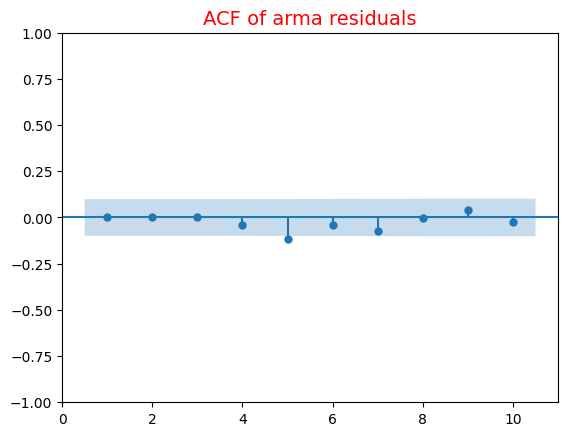

In [207]:
tsa_plots.plot_acf(arimaresid,zero=False,lags=10)
plt.title("ACF of arma residuals",c='r',size=14)
plt.show()

No auto correlation among the lags so residuals are free from Auto correlation.

### **Residuals must be random**

Text(0.5, 1.0, 'Arma Resid is normally distributed')

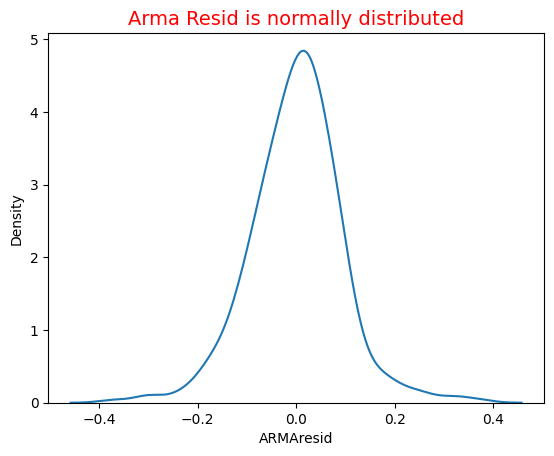

In [208]:
sns.kdeplot(data=Trn.ARMAresid)
plt.title("Arma Resid is normally distributed",c='r',size=14)

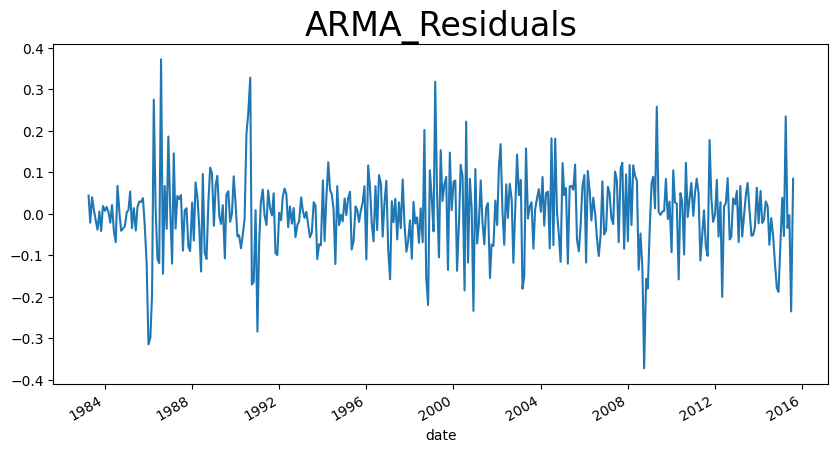

In [209]:
Trn.ARMAresid.plot(figsize=(10,5))
plt.title("ARMA_Residuals",size=24)
plt.show()

residual is random and no pattern its how the noise looks like so our model is good.

And mean of ressid also nearly zero can observe from above plot.

### ***MODEL Performance with Test Data***

In [210]:
Tst

,Log,LOGDif,Sqrt,Exp,Inverse,BOXCOX,DiffBoxcox,AR,MA
date,,,,,,,,,
2015-09-01,3.808660,-0.087233,6.714909,3.822418e+19,0.022178,2.548670,-0.036352,45.090000,45.090000
2015-10-01,3.841386,0.032725,6.825687,1.713089e+20,0.021464,2.562392,0.013722,45.530720,45.153110
2015-11-02,3.729301,-0.112085,6.453681,1.225646e+18,0.024010,2.514968,-0.047424,45.316335,45.216309
2015-12-01,3.611998,-0.117303,6.086050,1.219741e+16,0.026998,2.464025,-0.050943,47.135692,45.621714
2016-01-01,3.515121,-0.096877,5.798276,3.990070e+14,0.029744,2.420916,-0.043108,46.240913,45.464301
...,...,...,...,...,...,...,...,...,...
2021-11-01,4.187379,-0.216653,8.114801,3.965442e+28,0.015186,2.701394,-0.081637,96.982507,47.062839
2021-12-01,4.315887,0.128507,8.653323,3.311089e+32,0.013355,2.750301,0.048907,97.259482,46.984471
2022-01-03,4.460029,0.144142,9.300000,3.648629e+37,0.011562,2.803486,0.053185,92.261048,46.850817


In [211]:
ARMAmodel=ARIMA(Trn["LOGDif"],order=(2,0,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [212]:
ARMAresult=ARMAmodel.fit()

In [213]:
start_value = pd.to_datetime('2015-09-01')
end_value = pd.to_datetime('2022-03-01')

In [214]:
start_index = Tst["LOGDif"].index.get_loc(start_value)
end_index = Tst["LOGDif"].index.get_loc(end_value)

In [215]:
PredictedARMA=ARMAresult.predict(satart=start_index, end=end_index)

In [216]:
#PredictedARMA=PredictedARMA.cumsum()+Tst.LOGDif.iloc[-1]

In [217]:
#PredictedARMA=np.exp(PredictedARMA)

In [218]:
#ARMA_mse = np.mean((Test["price"] - PredictedARMA)**2)

In [219]:
#ARMA_mse

In [220]:
#ARMA_rmse=np.sqrt(ARMA_mse)

In [221]:
#ARMA_rmse

In [222]:
testPredictarma=ARMAresult.predict(satart=start_index, end=end_index)

In [223]:
testPredictarmalist = []
testPredictarmalist.append(Tst.Log[0])  # Initialize with the first value of the log-transformed series

for i in range(1, len(Tst)):
    testPredictarmalist.append(testPredictarmalist[i-1] + testPredictarma[i-1])

testPredictarma = np.array(testPredictarmalist)
testPredictarma = np.exp(testPredictarma)

In [224]:
testPredictarma

array([45.09      , 45.15308427, 45.21625679, 45.6209846 , 45.46609663,
       45.8905225 , 45.99266954, 45.92841887, 45.69246575, 45.83961036,
       45.54873796, 45.81449277, 45.90810485, 46.10889947, 46.20126767,
       46.08542992, 46.35029532, 46.04290752, 45.58951253, 46.27653747,
       46.25445289, 45.99274971, 45.80377153, 45.65549638, 45.77159691,
       45.90607967, 46.40990265, 46.12998563, 46.35514089, 46.06116661,
       46.30262744, 46.59081214, 46.87091679, 47.23107875, 47.01713802,
       46.12111298, 43.74684775, 41.79843562, 40.63567016, 42.91514974,
       42.78796633, 42.04334523, 41.3092316 , 44.34955742, 42.87544206,
       43.67147469, 43.3474511 , 44.94876696, 44.87301994, 43.9971828 ,
       45.35777854, 44.95562117, 45.43600886, 45.7347705 , 46.14665366,
       45.43346925, 45.66820572, 45.8182784 , 45.22400276, 44.64147065,
       45.00367434, 44.50179124, 45.25318039, 45.51248205, 45.28546723,
       44.26164267, 45.23806786, 44.41892055, 43.73022591, 44.13

In [225]:
Tst['ARMA']=testPredictarma

In [226]:
ARMA_rmse=np.sqrt(np.mean((OILDATA.iloc[390:,0] - testPredictarma)**2))
ARMA_rmse

17.843432580931893

## ***ARIMA Model***

**Grid Search CV To find ARIMA Parameters**

In [227]:
# evaluate an ARIMA model for a given order (d) and return RMSE
def evaluate_arima_model(X, arima_order):
# prepare training dataset
    X = X.astype('float32')
    train_size = int(len(X) * 0.70)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
# make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
# calculate out of sample error
    rmse = np.sqrt(mean_squared_error(test, predictions))
    return rmse

In [228]:
def evaluate_models(dataset,d_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None
    for d in d_values:
                order = (2,d,2)
                try:
                    rmse = evaluate_arima_model(dataset, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    #print('ARIMA%s RMSE=%.3f' % (order,rmse))
                except Exception as e:
                    print(e)
                    continue
    print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [229]:
d_values = range(0, 5)
evaluate_models(Trn["LOGDif"] ,d_values)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

Best ARIMA(2, 1, 2) RMSE=0.093


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [230]:
ARIMAmodel=ARIMA(Trn["LOGDif"],order=(2,1,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [231]:
ARIMAresult=ARIMAmodel.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [232]:
ARIMAresult.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 LOGDif   No. Observations:                  390
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 358.012
Date:                Sun, 23 Jul 2023   AIC                           -706.024
Time:                        07:10:38   BIC                           -686.207
Sample:                             0   HQIC                          -698.168
                                - 390                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8167      0.037    -22.094      0.000      -0.889      -0.744
ar.L2          0.1641      0.038      4.360      0.000       0.090       0.238
ma.L1         -0.0006    134.796  -4.81e-06      1.000    -264.196     264.195
ma.L2         -0.9994    134.707     -0.007      0.994    -265.021     263.022
sigma2         0.0087      1.177      0.007      0.994      -2.297       2.315
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                78.96
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               0.89   Skew:                             0.06
Prob(H) (two-sided):                  0.53   Kurtosis:                         5.20
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [233]:
Trn["ARIMAresid"]=ARIMAresult.resid

In [234]:
Trn["ARIMAresid"]

date
1983-03-30         NaN
1983-04-04    0.045417
1983-05-02   -0.057901
1983-06-01    0.025513
1983-07-01   -0.008436
                ...   
2015-04-01    0.235276
2015-05-01   -0.035005
2015-06-01   -0.010002
2015-07-01   -0.239045
2015-08-03    0.091462
Name: ARIMAresid, Length: 390, dtype: float64

In [235]:
Trn["ARIMAresid"].mean()

0.0017908355645448323

In [236]:
Trn["ARIMAresid"].var()

0.008848706835614437

**Model performance with Test data**

In [237]:
ARIMAmodel=ARIMA(Tst["LOGDif"],order=(2,1,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [238]:
ARIMAresult=ARIMAmodel.fit()

In [239]:
start_value = pd.to_datetime('2015-09-01')
end_value = pd.to_datetime('2022-03-01')

In [240]:
start_index = Tst["LOGDif"].index.get_loc(start_value)
end_index = Tst["LOGDif"].index.get_loc(end_value)

In [241]:
testPredictarima=ARIMAresult.predict(satart=start_index, end=end_index)

In [242]:
testPredictarimalist = []
testPredictarimalist.append(Tst.Log[0])  # Initialize with the first value of the log-transformed series

for i in range(1, len(Tst)):
    testPredictarimalist.append(testPredictarimalist[i-1] + testPredictarima[i-1])

testPredictarima = np.array(testPredictarimalist)
testPredictarima = np.exp(testPredictarima)


In [243]:
testPredictarima

array([45.09      , 45.09      , 41.3233354 , 41.22387872, 37.05773453,
       35.06067916, 31.97596958, 30.82865669, 30.21066971, 30.44670114,
       29.79158941, 29.65681168, 28.18290064, 29.65474096, 28.7420578 ,
       28.62396211, 29.07904207, 29.28061582, 28.86483721, 29.51336598,
       28.62717349, 29.20429691, 28.74251119, 28.61673785, 29.42338027,
       28.10128262, 29.79354231, 28.8452688 , 29.83138612, 29.63825936,
       30.43529182, 29.64868912, 31.08354911, 30.79771691, 31.01929446,
       32.24893844, 30.95600228, 32.65919162, 32.37224535, 31.80274392,
       30.84333748, 31.47422231, 32.86819333, 31.90772696, 32.84358907,
       32.77539183, 31.31522568, 33.96708334, 31.88765392, 32.8733396 ,
       32.42493021, 32.875629  , 32.86052397, 33.66233113, 31.5644738 ,
       32.35539794, 26.31939152, 31.57174321, 32.69424379, 30.06546736,
       31.31089513, 30.69996988, 30.28040083, 29.68157163, 32.17037187,
       30.1382169 , 31.71478604, 31.7797604 , 30.92709417, 32.32

In [244]:
Tst['Arima']=testPredictarima

In [245]:
ARIMA_rmse=np.sqrt(np.mean((Test["price"] - Tst['Arima'])**2))

###***Evaluation of mape metrics***

In [246]:
def MAPE(pred,orig):
  temp=np.abs((pred-orig)/pred)*100
  return np.mean(temp)

### ***Simple Exponential Smoothing***

In [247]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

In [248]:
Test.index[0]

Timestamp('2016-07-01 00:00:00')

In [249]:
Test["price"]

date
2016-07-01     41.60
2016-08-01     44.70
2016-09-01     48.24
2016-10-03     46.86
2016-11-01     49.44
               ...  
2021-11-01     65.85
2021-12-01     74.88
2022-01-03     86.49
2022-02-01     95.72
2022-03-01    109.33
Name: price, Length: 69, dtype: float64

In [250]:

SES=[]
x=np.linspace(0.1,1,20)
for i in x:
    ses_model=SimpleExpSmoothing(Train['price']).fit(smoothing_level=i)
    test_pred_ses = ses_model.forecast(69)

    score_simple=MAPE(test_pred_ses,Test.price)
    SES.append((i,score_simple))
    print("smoothing_level ",i,"-->","MAPE Error",score_simple)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-p

smoothing_level  0.1 --> MAPE Error nan
smoothing_level  0.1473684210526316 --> MAPE Error nan
smoothing_level  0.19473684210526315 --> MAPE Error nan
smoothing_level  0.24210526315789474 --> MAPE Error nan
smoothing_level  0.2894736842105263 --> MAPE Error nan
smoothing_level  0.33684210526315794 --> MAPE Error nan
smoothing_level  0.38421052631578945 --> MAPE Error nan
smoothing_level  0.43157894736842106 --> MAPE Error nan
smoothing_level  0.4789473684210527 --> MAPE Error nan
smoothing_level  0.5263157894736842 --> MAPE Error nan
smoothing_level  0.5736842105263158 --> MAPE Error nan
smoothing_level  0.6210526315789474 --> MAPE Error nan
smoothing_level  0.6684210526315789 --> MAPE Error nan
smoothing_level  0.7157894736842105 --> MAPE Error nan
smoothing_level  0.7631578947368421 --> MAPE Error nan
smoothing_level  0.8105263157894737 --> MAPE Error nan
smoothing_level  0.8578947368421053 --> MAPE Error nan
smoothing_level  0.9052631578947369 --> MAPE Error nan
smoothing_level  0.9

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-p

In [251]:
from math import sqrt
ses_model = SimpleExpSmoothing(Train["price"]).fit(optimized=True)
test_pred_ses = ses_model.forecast(69)
train_pred_ses = ses_model.fittedvalues
test_rmse_ses = sqrt(mean_squared_error(test_pred_ses,Test["price"]))
# train_rmse_ses = sqrt(mean_squared_error(train_pred_ses,TST))
mape_ses = MAPE(test_pred_ses,Test["price"])
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ses),"\n")\
# 'Train Root Mean Squared Error = {}'.format(train_rmse_ses),"\n",
# 'Test Root Mean Squared Error = {}'.format(test_rmse_ses))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = nan 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [252]:
SEM=pd.DataFrame(SES,columns=["smoothing_level","score"])
SEM.sort_values(["score"])

,smoothing_level,score
0,0.100000,NaN
1,0.147368,NaN
2,0.194737,NaN
3,0.242105,NaN
4,0.289474,NaN
5,0.336842,NaN
6,0.384211,NaN
7,0.431579,NaN
8,0.478947,NaN
9,0.526316,NaN


In [253]:
ses_model=SimpleExpSmoothing(Train["price"]).fit(smoothing_level=0.1)
pred_ses = ses_model.forecast(69)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [254]:
rmse_ses = np.sqrt(mean_squared_error(Test.price, pred_ses))
print("SES RMSE:", rmse_ses)

SES RMSE: 15.880654941030606


In [255]:
pred_sesdf=pd.DataFrame(columns=['price'],index=Test.index)

In [256]:
pred_ses

400    51.5343
401    51.5343
402    51.5343
403    51.5343
404    51.5343
        ...   
464    51.5343
465    51.5343
466    51.5343
467    51.5343
468    51.5343
Length: 69, dtype: float64

In [257]:
pred_sesdf['price'] = pred_ses.values
pred_sesdf

,price
date,
2016-07-01,51.5343
2016-08-01,51.5343
2016-09-01,51.5343
2016-10-03,51.5343
2016-11-01,51.5343
...,...
2021-11-01,51.5343
2021-12-01,51.5343
2022-01-03,51.5343


 SES predicts only one constant data.

### ***Double Exponential Method(Holt Method)***

In [258]:
from statsmodels.tsa.holtwinters import Holt

In [259]:
alphas=np.arange(0.1,1,0.9/10)
betas=np.arange(0.1,1,0.9/10)
l=[]
for i in alphas :
    for j in betas:
        hw_model = Holt(Train["price"]).fit(smoothing_level=i, smoothing_slope=j)

        pred_hw =hw_model.forecast(69)

        score=MAPE(pred_hw,Test.price)
        #print("smoothing_level ",i," smoothing_slope",j,"-->","MAPE Error",score)
        l.append((i,j,score))
        errors_sorted = sorted(l, key=lambda x: x[2])

#print the results in ascending order of error
for score, i, j in errors_sorted:
   print(f"smoothing_level {i:.2f}, smoothing_slope {j:.2f} --> MAPE Error {score:.2f}")

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-p

smoothing_level 0.10, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.19, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.28, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.37, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.46, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.55, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.64, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.73, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.82, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.91, smoothing_slope nan --> MAPE Error 0.10
smoothing_level 0.10, smoothing_slope nan --> MAPE Error 0.19
smoothing_level 0.19, smoothing_slope nan --> MAPE Error 0.19
smoothing_level 0.28, smoothing_slope nan --> MAPE Error 0.19
smoothing_level 0.37, smoothing_slope nan --> MAPE Error 0.19
smoothing_level 0.46, smoothing_slope nan --> MAPE Error 0.19
smoothing_level 0.55, smoothing_slope nan --> MAPE Error 0.19
smoothin

In [260]:
HM=pd.DataFrame(l,columns=["smoothing_level","smoothing_slope","score"])
HM.sort_values(["score"])

,smoothing_level,smoothing_slope,score
0,0.10,0.10,NaN
1,0.10,0.19,NaN
2,0.10,0.28,NaN
3,0.10,0.37,NaN
4,0.10,0.46,NaN
...,...,...,...
95,0.91,0.55,NaN
96,0.91,0.64,NaN
97,0.91,0.73,NaN
98,0.91,0.82,NaN


In [261]:
hw_model = Holt(Train["price"]).fit(smoothing_level=0.91, smoothing_slope=0.82)
pred_hw = hw_model.forecast(69)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [262]:
rmse_hw = np.sqrt(mean_squared_error(Test.price, pred_hw))
print("Holt's  RMSE:", rmse_hw)

Holt's  RMSE: 14.426257255563502


In [263]:
pred_hwdf=pd.DataFrame(columns=['price'],index=Test.index)

In [264]:
pred_hwdf['price']=pred_hw.values

In [265]:
pred_hwdf

,price
date,
2016-07-01,49.154570
2016-08-01,49.483135
2016-09-01,49.811700
2016-10-03,50.140265
2016-11-01,50.468831
...,...
2021-11-01,70.182741
2021-12-01,70.511307
2022-01-03,70.839872


### ***Holts winter exponential smoothing with additive seasonality and additive trend***

In [266]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [267]:
HWADD_model=ExponentialSmoothing(Train["price"],trend="add",seasonal="add",seasonal_periods=12).fit()
pred_hwadd=HWADD_model.forecast(69)
MAPE(pred_hwadd,Test.price)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


nan

In [268]:
rmse_hwadd= np.sqrt(mean_squared_error(Test.price, pred_hwadd))
print("Holt's Winter - Additive Trend and Seasonality RMSE:", rmse_hwadd)

Holt's Winter - Additive Trend and Seasonality RMSE: 17.26101897928086


In [269]:
pred_hwadddf=pd.DataFrame(columns=['price'],index=Test.index)
pred_hwadddf['price']=pred_hwadd.values
pred_hwadddf

,price
date,
2016-07-01,48.229803
2016-08-01,48.495617
2016-09-01,48.030080
2016-10-03,46.751235
2016-11-01,45.398369
...,...
2021-11-01,47.981314
2021-12-01,47.747990
2022-01-03,47.288039


### ***Holts winter exponential smoothing with multiplicative seasonality and additive trend***

In [270]:
HWMUL_model=ExponentialSmoothing(Train["price"],trend="add",seasonal="mul",seasonal_periods=12).fit()
pred_hwmul=HWMUL_model.forecast(69)
MAPE(pred_hwmul,Test.price)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


nan

In [271]:
rmse_hwmul = np.sqrt(mean_squared_error(Test.price, pred_hwmul))
print("Holt's Winter - additive trend and multiplicative seasonality RMSE:", rmse_hwmul)

Holt's Winter - additive trend and multiplicative seasonality RMSE: 17.64214216542661


In [272]:
pred_hwmuldf=pd.DataFrame(columns=['price'],index=Test.index)
pred_hwmuldf['price']=pred_hwmul.values
pred_hwmuldf

,price
date,
2016-07-01,47.795557
2016-08-01,47.447562
2016-09-01,46.045979
2016-10-03,44.330179
2016-11-01,43.193399
...,...
2021-11-01,46.300525
2021-12-01,46.620097
2022-01-03,46.400176


### ***Holts winter exponential smoothing with multiplicative seasonality and Multiplicative trend***

In [273]:
HWMULMUL_model = ExponentialSmoothing(Train["price"], trend="mul", seasonal="mul", seasonal_periods=12).fit()
pred_hwmulmul = HWMULMUL_model.forecast(69)
score = MAPE(Test["price"], pred_hwmulmul)
print("MAPE Error:", score)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


MAPE Error: nan


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [274]:
rmse_hwmulmul = np.sqrt(mean_squared_error(Test.price, pred_hwmulmul))
print("Holt's Winter - Multiplicative Trend and Seasonality RMSE:", rmse_hwmulmul)

Holt's Winter - Multiplicative Trend and Seasonality RMSE: 22.82432192147932


In [275]:
rmse_hwmulmuldf=pd.DataFrame(columns=['price'],index=Test.index)
rmse_hwmulmuldf['price']=rmse_hwmulmul
rmse_hwmulmuldf

,price
date,
2016-07-01,22.824322
2016-08-01,22.824322
2016-09-01,22.824322
2016-10-03,22.824322
2016-11-01,22.824322
...,...
2021-11-01,22.824322
2021-12-01,22.824322
2022-01-03,22.824322


### **LSTM Model using RNN**

In [276]:
from keras.models import Sequential
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from keras.models import load_model
import keras
import h5py
import requests
import os

In [277]:
# convert an array of values into a dataset matrix
# let us give lookback as 2 from our previous ACF plot of LOGDif
def create_dataset(data, look_back=0):
    dataX = []
    dataY = []
    for i in range(len(data) - look_back):
        a = data.iloc[i:(i+look_back)].values
        dataX.append(a)
        dataY.append(data.iloc[i+look_back])
    return np.array(dataX), np.array(dataY)

In [278]:
# here LOGDif first value is nan so letus replace it with 0 for calculation purpose
Transform.LOGDif.iloc[0]=0
Transform.LOGDif.iloc[0]

0.0

In [279]:
train_data=Transform['LOGDif'].iloc[0:390]
test_data=Transform['LOGDif'].iloc[390:468]

In [280]:
x_train, y_train = create_dataset(train_data, look_back=0)
x_test, y_test = create_dataset(test_data, look_back=0)

In [281]:
# Reshape the input data
x_train = np.reshape(x_train, (x_train.shape[0],1, x_train.shape[1]))
x_test = np.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))

In [282]:
look_back = 0
model = Sequential()
model.add(LSTM(20, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

In [283]:
model.fit(x_train, y_train, epochs=20, batch_size=1, verbose=2)

Epoch 1/20
390/390 - 4s - loss: 0.0090 - 4s/epoch - 9ms/step
Epoch 2/20
390/390 - 1s - loss: 0.0092 - 817ms/epoch - 2ms/step
Epoch 3/20
390/390 - 1s - loss: 0.0091 - 797ms/epoch - 2ms/step
Epoch 4/20
390/390 - 1s - loss: 0.0091 - 779ms/epoch - 2ms/step
Epoch 5/20
390/390 - 1s - loss: 0.0091 - 816ms/epoch - 2ms/step
Epoch 6/20
390/390 - 1s - loss: 0.0091 - 790ms/epoch - 2ms/step
Epoch 7/20
390/390 - 1s - loss: 0.0091 - 819ms/epoch - 2ms/step
Epoch 8/20
390/390 - 1s - loss: 0.0091 - 766ms/epoch - 2ms/step
Epoch 9/20
390/390 - 1s - loss: 0.0091 - 731ms/epoch - 2ms/step
Epoch 10/20
390/390 - 1s - loss: 0.0091 - 947ms/epoch - 2ms/step
Epoch 11/20
390/390 - 1s - loss: 0.0091 - 1s/epoch - 3ms/step
Epoch 12/20
390/390 - 1s - loss: 0.0091 - 1s/epoch - 3ms/step
Epoch 13/20
390/390 - 1s - loss: 0.0091 - 1s/epoch - 3ms/step
Epoch 14/20
390/390 - 1s - loss: 0.0091 - 1s/epoch - 3ms/step
Epoch 15/20
390/390 - 1s - loss: 0.0091 - 986ms/epoch - 3ms/step
Epoch 16/20
390/390 - 1s - loss: 0.0090 - 777ms/e

In [284]:
trainPredict = model.predict(x_train)
testPredict = model.predict(x_test)

3/3 [==============================] - 0s 7ms/step


In [285]:
Trn.Log[0]

3.3765631007037946

In [286]:
# Reverse the predicted values of test to actual form
testPredictlist = []
testPredictlist.append(Tst.Log[0])  # Initialize with the first value of the log-transformed series

for i in range(1, len(Tst)):
    testPredictlist.append(testPredictlist[i-1] + testPredict[i-1][0])

testPredict = np.array(testPredictlist)
testPredict = np.exp(testPredict)


In [287]:
len(Trn)==len(trainPredict)

True

In [288]:
# Reverse the predicted values of train to actual form
trainPredictlist = []

for i in range(len(Trn)):
    if i == 0:
        trainPredictlist.append(Trn.Log[0])
    else:
        trainPredictlist.append(trainPredictlist[i-1] + trainPredict[i-1][0])

trainPredict = np.array(trainPredictlist)
trainPredict = np.exp(trainPredict)

trainPredict

array([29.27      , 29.23666111, 29.20336019, 29.1700972 , 29.1368721 ,
       29.10368484, 29.07053539, 29.03742369, 29.0043497 , 28.97131339,
       28.93831471, 28.90535361, 28.87243005, 28.839544  , 28.8066954 ,
       28.77388422, 28.74111041, 28.70837393, 28.67567473, 28.64301279,
       28.61038804, 28.57780046, 28.54524999, 28.51273659, 28.48026024,
       28.44782087, 28.41541845, 28.38305293, 28.35072429, 28.31843246,
       28.28617742, 28.25395911, 28.2217775 , 28.18963255, 28.15752421,
       28.12545244, 28.0934172 , 28.06141845, 28.02945615, 27.99753025,
       27.96564072, 27.93378751, 27.90197058, 27.87018989, 27.8384454 ,
       27.80673707, 27.77506485, 27.74342871, 27.7118286 , 27.68026448,
       27.64873632, 27.61724407, 27.58578768, 27.55436713, 27.52298237,
       27.49163335, 27.46032004, 27.4290424 , 27.39780038, 27.36659394,
       27.33542305, 27.30428767, 27.27318775, 27.24212325, 27.21109414,
       27.18010036, 27.14914189, 27.11821868, 27.0873307 , 27.05

In [289]:
testPredict

array([45.09      , 45.03864193, 44.98734236, 44.93610122, 44.88491845,
       44.83379397, 44.78272773, 44.73171965, 44.68076966, 44.62987771,
       44.57904373, 44.52826765, 44.4775494 , 44.42688892, 44.37628615,
       44.32574101, 44.27525344, 44.22482338, 44.17445076, 44.12413552,
       44.07387758, 44.02367689, 43.97353338, 43.92344698, 43.87341763,
       43.82344526, 43.77352982, 43.72367123, 43.67386942, 43.62412435,
       43.57443593, 43.52480411, 43.47522882, 43.42571   , 43.37624758,
       43.32684149, 43.27749169, 43.22819809, 43.17896064, 43.12977927,
       43.08065391, 43.03158452, 42.98257101, 42.93361333, 42.88471141,
       42.8358652 , 42.78707462, 42.73833961, 42.68966011, 42.64103606,
       42.5924674 , 42.54395405, 42.49549596, 42.44709306, 42.3987453 ,
       42.3504526 , 42.30221492, 42.25403217, 42.2059043 , 42.15783126,
       42.10981297, 42.06184937, 42.0139404 , 41.96608601, 41.91828611,
       41.87054067, 41.82284961, 41.77521286, 41.72763038, 41.68

In [290]:
pred_testpredict=pd.DataFrame(columns=['price'],index=Tst.index)
pred_testpredict['price']=testPredict
pred_testpredict

,price
date,
2015-09-01,45.090000
2015-10-01,45.038642
2015-11-02,44.987342
2015-12-01,44.936101
2016-01-01,44.884918
...,...
2021-11-01,41.443271
2021-12-01,41.396067
2022-01-03,41.348916


### ***RMSE score of LSTM Model***

In [291]:
trainScore = np.sqrt(mean_squared_error(OILDATA.iloc[:390,0], trainPredict))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(OILDATA.iloc[390:,0], testPredict))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 36.99 RMSE
Test Score: 19.59 RMSE


## ***Face book Prophet Model***

reference link:1.)https://facebook.github.io/prophet/docs/quick_start.html#python-api

2.)https://towardsdatascience.com/monte-carlo-markov-chain-mcmc-explained-94e3a6c8de11

3.)https://hands-on.cloud/facebook-prophet-a-simple-algorithm-for-time-series-data/#:~:text=In%202017%2C%20researchers%20at%20Facebook%20published%20a%20paper,Scale%20%E2%80%9D%20which%20introduced%20the%20project%20Facebook%20Prophet.

The Facebook Prophet is accurate and fast.

Prophet allows adjustment of parameters and customized seasonality components which may improve the forecasts.

Prophet can also handle outliers and handles other data issues by itself.

The holiday function allows Prophet to adjust forecasting when a holiday or major event may change the forecast.

It can detect the change points automatically.

In [292]:
pip install prophet

In [293]:
from prophet import Prophet
new_df=pd.read_csv("/content/sample_data/crude-oil-price.csv")

In [294]:
PROPHETDATAFRAME=pd.DataFrame(data=new_df.iloc[:,:2])

In [295]:
PROPHETDATAFRAME

,date,price
0,1983-03-30T00:00:00,29.27
1,1983-04-04T00:00:00,30.63
2,1983-05-02T00:00:00,30.25
3,1983-06-01T00:00:00,31.38
4,1983-07-01T00:00:00,32.00
...,...,...
464,2021-11-01T00:00:00,65.85
465,2021-12-01T00:00:00,74.88
466,2022-01-03T00:00:00,86.49
467,2022-02-01T00:00:00,95.72


In [296]:
PROPHETDATAFRAME.rename(columns={'date':'ds','price':'y'},inplace=True)

In [297]:
PROPHETDATAFRAME

,ds,y
0,1983-03-30T00:00:00,29.27
1,1983-04-04T00:00:00,30.63
2,1983-05-02T00:00:00,30.25
3,1983-06-01T00:00:00,31.38
4,1983-07-01T00:00:00,32.00
...,...,...
464,2021-11-01T00:00:00,65.85
465,2021-12-01T00:00:00,74.88
466,2022-01-03T00:00:00,86.49
467,2022-02-01T00:00:00,95.72


In [298]:
PTRN=PROPHETDATAFRAME.head(400)
PTST=PROPHETDATAFRAME.tail(69)

In [299]:
PTRN

,ds,y
0,1983-03-30T00:00:00,29.27
1,1983-04-04T00:00:00,30.63
2,1983-05-02T00:00:00,30.25
3,1983-06-01T00:00:00,31.38
4,1983-07-01T00:00:00,32.00
...,...,...
395,2016-02-01T00:00:00,33.75
396,2016-03-01T00:00:00,38.34
397,2016-04-01T00:00:00,45.92
398,2016-05-02T00:00:00,49.10


In [300]:
PTST

,ds,y
400,2016-07-01T00:00:00,41.60
401,2016-08-01T00:00:00,44.70
402,2016-09-01T00:00:00,48.24
403,2016-10-03T00:00:00,46.86
404,2016-11-01T00:00:00,49.44
...,...,...
464,2021-11-01T00:00:00,65.85
465,2021-12-01T00:00:00,74.88
466,2022-01-03T00:00:00,86.49
467,2022-02-01T00:00:00,95.72


In [301]:
m=Prophet()
m.fit(PTRN)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp40nv2r41/atxmw_4z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp40nv2r41/ty7o11tz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87603', 'data', 'file=/tmp/tmp40nv2r41/atxmw_4z.json', 'init=/tmp/tmp40nv2r41/ty7o11tz.json', 'output', 'file=/tmp/tmp40nv2r41/prophet_modelokynpzpa/prophet_model-20230723071116.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:11:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:11:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [302]:
len(PTST)

69

In [303]:
future = m.make_future_dataframe(periods=69,freq='M')
future.tail()

,ds
464,2021-10-31
465,2021-11-30
466,2021-12-31
467,2022-01-31
468,2022-02-28


In [304]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
464,2021-10-31,79.618210,62.149534,96.454686
465,2021-11-30,60.130575,42.303901,77.615711
466,2021-12-31,61.189885,44.667720,77.817362
467,2022-01-31,67.561956,49.131727,84.849636
468,2022-02-28,65.243274,47.530978,82.011949


In [305]:
Tst.LOGDif[0]

-0.08723313106526964

In [306]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1983-03-30,24.044300,7.646630,38.780624,24.044300,24.044300,-1.906635,-1.906635,-1.906635,-2.074261,-2.074261,-2.074261,0.167626,0.167626,0.167626,0.0,0.0,0.0,22.137665
1,1983-04-04,24.040619,8.119821,40.082736,24.040619,24.040619,-0.147095,-0.147095,-0.147095,-2.608035,-2.608035,-2.608035,2.460940,2.460940,2.460940,0.0,0.0,0.0,23.893524
2,1983-05-02,24.020007,6.695662,37.700927,24.020007,24.020007,-2.171444,-2.171444,-2.171444,-2.608035,-2.608035,-2.608035,0.436591,0.436591,0.436591,0.0,0.0,0.0,21.848563
3,1983-06-01,23.997922,4.141466,36.605165,23.997922,23.997922,-3.754968,-3.754968,-3.754968,-2.074261,-2.074261,-2.074261,-1.680707,-1.680707,-1.680707,0.0,0.0,0.0,20.242954
4,1983-07-01,23.975838,8.850015,39.716175,23.975838,23.975838,-0.039454,-0.039454,-0.039454,-1.687171,-1.687171,-1.687171,1.647717,1.647717,1.647717,0.0,0.0,0.0,23.936384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
464,2021-10-31,69.069911,62.149534,96.454686,62.399003,75.459730,10.548298,10.548298,10.548298,2.541172,2.541172,2.541172,8.007126,8.007126,8.007126,0.0,0.0,0.0,79.618210
465,2021-11-30,68.959951,42.303901,77.615711,62.116479,75.471034,-8.829377,-8.829377,-8.829377,-0.104904,-0.104904,-0.104904,-8.724473,-8.724473,-8.724473,0.0,0.0,0.0,60.130575
466,2021-12-31,68.846326,44.667720,77.817362,61.824450,75.492529,-7.656441,-7.656441,-7.656441,-1.687171,-1.687171,-1.687171,-5.969270,-5.969270,-5.969270,0.0,0.0,0.0,61.189885
467,2022-01-31,68.732701,49.131727,84.849636,61.566921,75.524592,-1.170745,-1.170745,-1.170745,-2.608035,-2.608035,-2.608035,1.437290,1.437290,1.437290,0.0,0.0,0.0,67.561956


In [307]:
OILDATA.tail(10)

,price,percentChange,change,Month,Year,Day,Time
date,,,,,,,
2021-06-01,73.47,9.771403,6.54,Jun,2021,01,00:00:00
2021-07-01,73.95,0.653328,0.48,Jul,2021,01,00:00:00
2021-08-02,68.50,-7.369844,-5.45,Aug,2021,02,00:00:00
2021-09-01,75.03,9.532847,6.53,Sep,2021,01,00:00:00
2021-10-01,81.78,8.996401,6.75,Oct,2021,01,00:00:00
2021-11-01,65.85,-19.479090,-15.93,Nov,2021,01,00:00:00
2021-12-01,74.88,13.712984,9.03,Dec,2021,01,00:00:00
2022-01-03,86.49,15.504808,11.61,Jan,2022,03,00:00:00
2022-02-01,95.72,10.671754,9.23,Feb,2022,01,00:00:00


### ***Prophet forecacst plot***

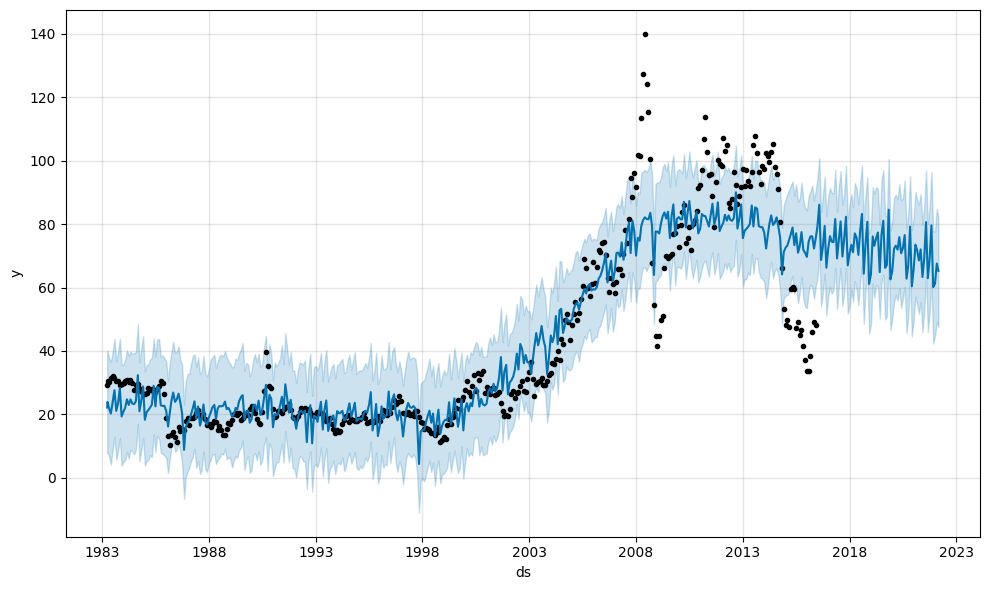

In [308]:
fig1 = m.plot(forecast)

### ***Prophet forecast components***

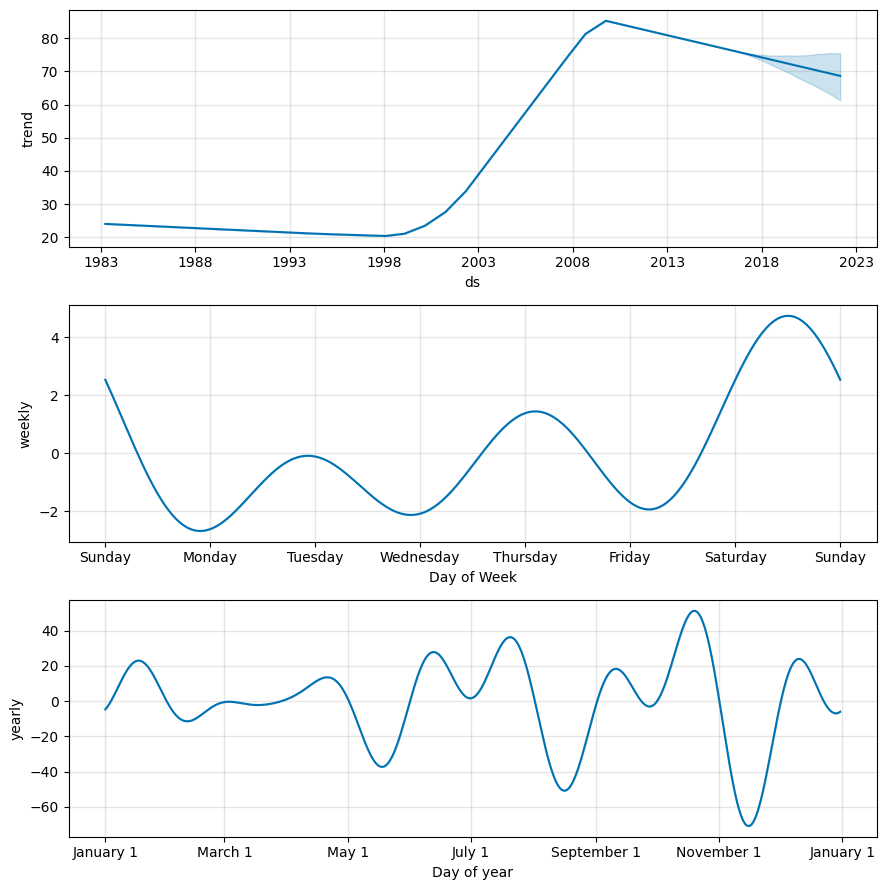

In [309]:
fig2 = m.plot_components(forecast)

### ***Forecasting plot for prophet***

In [310]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [311]:
plot_components_plotly(m, forecast)

###***rmse of prophet method***

In [312]:
prmse=np.sqrt(mean_squared_error(PTST['y'],forecast.iloc[400:,1]))

In [313]:
prmse

21.98971002828178

In [314]:
len(PTST)

69

In [315]:
len(forecast)

469

In [316]:
help(Prophet.fit)

Help on function fit in module prophet.forecaster:

fit(self, df, **kwargs)
    Fit the Prophet model.
    
    This sets self.params to contain the fitted model parameters. It is a
    dictionary parameter names as keys and the following items:
        k (Mx1 array): M posterior samples of the initial slope.
        m (Mx1 array): The initial intercept.
        delta (MxN array): The slope change at each of N changepoints.
        beta (MxK matrix): Coefficients for K seasonality features.
        sigma_obs (Mx1 array): Noise level.
    Note that M=1 if MAP estimation.
    
    Parameters
    ----------
    df: pd.DataFrame containing the history. Must have columns ds (date
        type) and y, the time series. If self.growth is 'logistic', then
        df must also have a column cap that specifies the capacity at
        each ds.
    kwargs: Additional arguments passed to the optimizing or sampling
        functions in Stan.
    
    Returns
    -------
    The fitted Prophet object.

## **RMSE DataFrame**

In [317]:
Model_Performance=pd.DataFrame(columns=["Method","RMSE"])
Model_Performance["Method"]=["ARIMA","AR","MA","ARMA","NAIVE","simple exp smoothing","Double exponential method(Holt method)",
                            "Holtwinter Additive trend and additive seasonality","HW Additive trend and multiplicative seasonality","HW Mult trend and Mult seasonality","LSTM","prophet"]
Model_Performance["RMSE"]=[ARIMA_rmse,AR_rmse,MA_rmse,ARMA_rmse,Naive_rmse,rmse_ses,rmse_hw,
                          rmse_hwadd,rmse_hwmul,rmse_hwmulmul,trainScore,prmse]
#Model_Performance["MSE"]=[ARIMA_mse,AR_mse,MA_mse,ARMA_mse,Naive_mse]
Model_Performance.sort_values(by=[ "RMSE"], ascending=[True], inplace=True)

In [318]:
Model_Performance.reset_index(drop=True,inplace=True)

In [319]:
Model_Performance

,Method,RMSE
0,NAIVE,6.214838
1,MA,9.846423
2,AR,14.381126
3,Double exponential method(Holt method),14.426257
4,simple exp smoothing,15.880655
5,Holtwinter Additive trend and additive seasona...,17.261019
6,HW Additive trend and multiplicative seasonality,17.642142
7,ARMA,17.843433
8,prophet,21.989710
9,HW Mult trend and Mult seasonality,22.824322


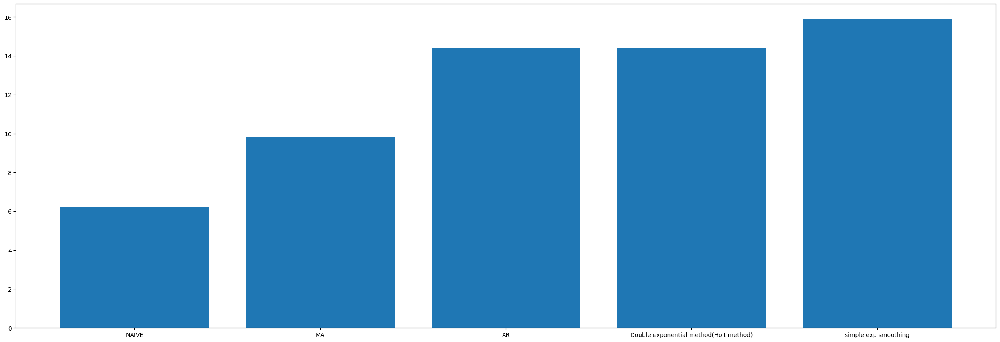

In [320]:
plt.figure(figsize=(30,10))
plt.bar(Model_Performance['Method'].head(5),Model_Performance['RMSE'].head(5))
plt.show()

## ***Prediction Plot***

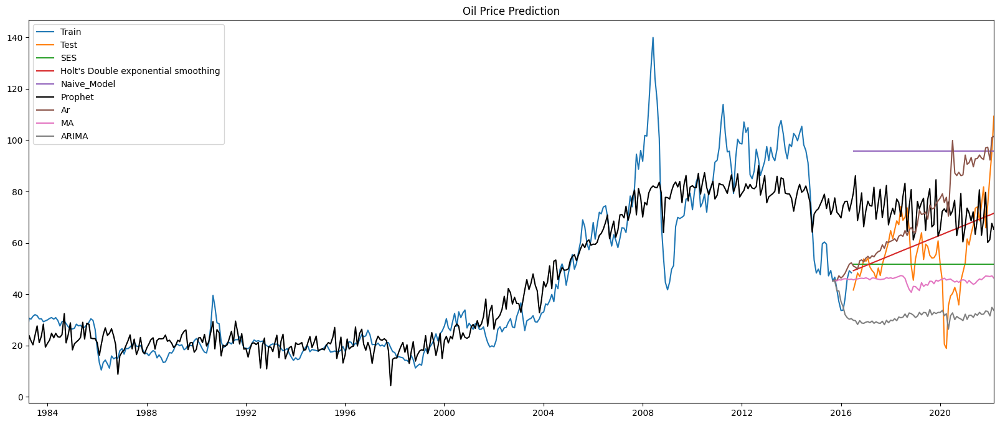

In [321]:
plt.figure(figsize=(20,8))
plt.title("Oil Price Prediction")
plt.plot(Train["price"],label="Train")
plt.plot(Test["price"],label="Test")

plt.plot(pred_sesdf['price'],label="SES")
plt.plot(pred_hwdf['price'],label="Holt's Double exponential smoothing")
plt.plot(Test['naive_forecast'],label="Naive_Model")
plt.plot( forecast["ds"],forecast["yhat"], label="Prophet", c="k")
plt.plot(Tst['AR'],label='Ar')
plt.plot(Tst['MA'],label='MA')
plt.plot(Tst['Arima'],label='ARIMA')
plt.xlim(Train["price"].index.min(),Test["price"].index.max())

plt.legend(loc="best")

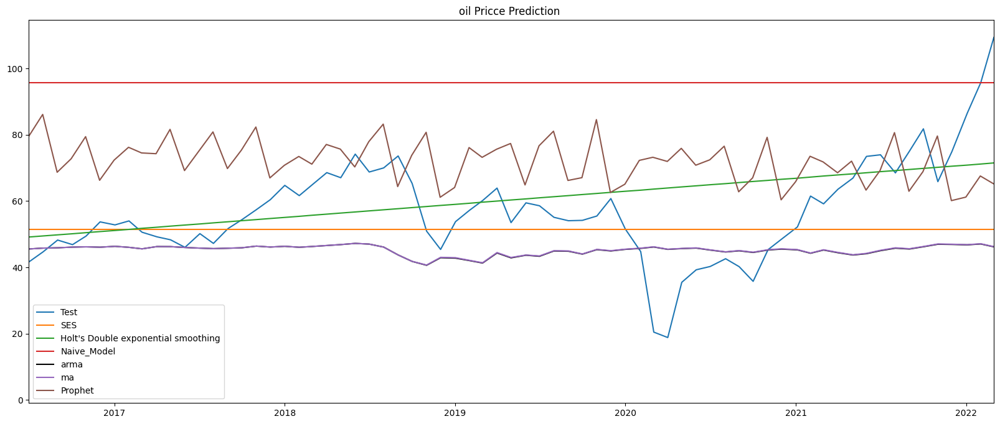

In [322]:
plt.figure(figsize=(20,8))
plt.title("oil Pricce Prediction ")
#plt.plot(Train["price"],label="Train")
plt.plot(Test["price"],label="Test")


plt.plot(pred_sesdf['price'],label="SES")
plt.plot(pred_hwdf['price'],label="Holt's Double exponential smoothing")
plt.plot(Test['naive_forecast'],label="Naive_Model")
plt.plot(Tst['ARMA'],label='arma',c='k')
plt.plot(Tst['MA'],label='ma')
plt.plot(forecast["ds"], forecast["yhat"], label="Prophet")


plt.xlim(Test["price"].index.min(),Test["price"].index.max())
plt.legend(loc="best")

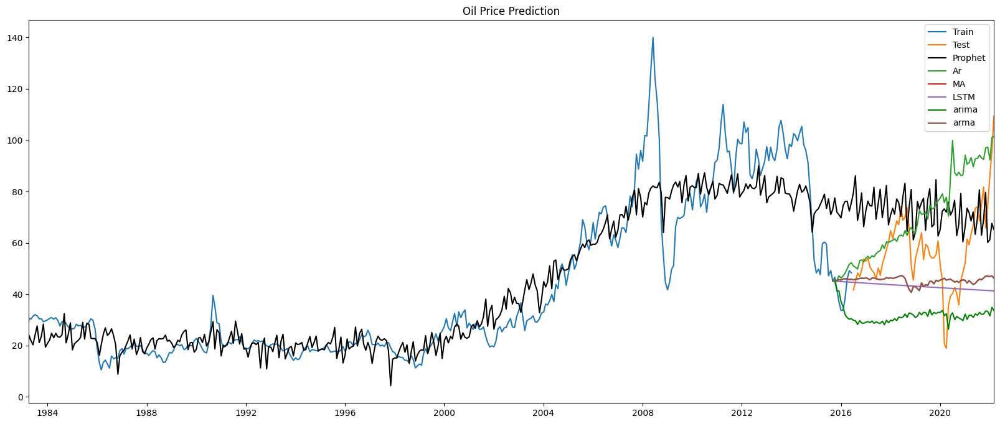

In [323]:
plt.figure(figsize=(20,8))

plt.title("Oil Price Prediction")
plt.plot(Train["price"],label="Train")
plt.plot(Test["price"],label="Test")

plt.plot( forecast["ds"],forecast["yhat"], label="Prophet", c="k")
plt.plot(Tst['AR'],label='Ar')
#plt.plot(Tst['MA'],label='MA',c='r')
plt.plot(Tst['MA'],label='MA')
plt.plot(pred_testpredict['price'],label='LSTM')
plt.plot(Tst['Arima'],label='arima',c='g')
plt.plot(Tst['ARMA'],label='arma')
plt.xlim(Train["price"].index.min(),Test["price"].index.max())

plt.legend(loc="best")

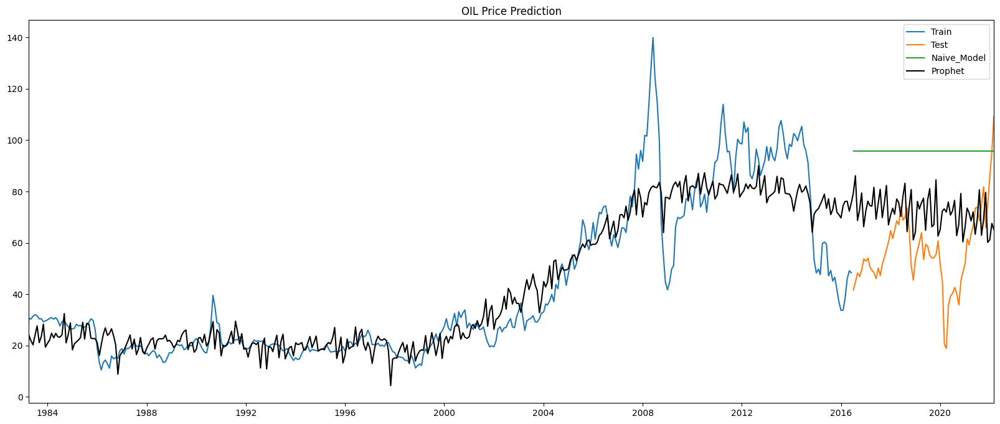

In [324]:
plt.figure(figsize=(20,8))

plt.title("OIL Price Prediction")
plt.plot(Train["price"],label="Train")
plt.plot(Test["price"],label="Test")

plt.plot(Test['naive_forecast'],label="Naive_Model")
plt.plot( forecast["ds"],forecast["yhat"], label="Prophet", c="k")

plt.xlim(Train["price"].index.min(),Test["price"].index.max())

plt.legend(loc="best")

## ***CONCLUSION***

So  based on above plots we confirmed that Prophet is the best model.(LSTM Model also not much better).After considering the plot and RMSE we can see that Prophet follows good as per graph and RMSE alse even though some other model RMSE less than Prophet we can ignore other model since those are not perfect for forecacsting.

### ***Code for Binary coded file creation for streamlit deployment***

In [325]:
from pickle import dump

In [326]:
dump(m,open('prophet.pkl','wb'))